## **Subjective Experience Experiment: MEG Analysis** 

## Setup

In [1]:
import mne
mne.set_config("MNE_BROWSE_RAW_SIZE", "6,12") 
mne.set_config("MNE_TQDM", "tqdm.auto")
mne.set_config("MNE_BROWSER_USE_OPENGL", "true") 
mne.set_config("MNE_BROWSER_BACKEND", "matplotlib")
mne.set_config("MNE_BROWSER_THEME", "light")
mne.set_config("MNE_3D_OPTION_THEME", "light")
mne.set_config("MNE_TQDM", "tqdm")
mne.viz.set_browser_backend("matplotlib")
mne.viz.set_3d_backend("notebook")
mne.set_log_level("ERROR")

Using matplotlib as 2D backend.
Using notebook 3d backend.


In [2]:
mne.sys_info(check_version=False)

Platform             Linux-5.15.186.el8-x86_64-with-glibc2.39
Python               3.12.3 (main, Jun 18 2025, 17:59:45) [GCC 13.3.0]
Executable           /work/AdvCogNeuro/venv/bin/python
CPU                  Intel(R) Xeon(R) Gold 6130 CPU @ 2.10GHz (64 cores)
Memory               376.5 GiB

Core
├☑ mne               1.10.0 ()
├☑ numpy             2.3.4 (OpenBLAS 0.3.30 with 64 threads)
├☑ scipy             1.16.1
└☑ matplotlib        3.10.6 (backend=module://matplotlib_inline.backend_inline)

Numerical (optional)
├☑ sklearn           1.7.1
├☑ numba             0.62.1
├☑ nibabel           5.3.2
├☑ pandas            2.3.1
├☑ h5io              0.2.5
├☑ h5py              3.15.1
└☐ unavailable       nilearn, dipy, openmeeg, cupy

Visualization (optional)
├☑ pyvista           0.46.3 (OpenGL unavailable)
├☑ pyvistaqt         0.11.3
├☑ vtk               9.5.1
├☑ ipympl            0.9.7
├☑ ipywidgets        8.1.7
└☐ unavailable       qtpy, pyqtgraph, mne-qt-browser, trame_client, trame_server,

In [3]:
%matplotlib widget
import matplotlib
matplotlib.use("Agg") # force static matplotlib plots
from matplotlib import (
    pyplot as plt,
    ticker,
    patheffects,
)
plt.style.use("minimal.mplstyle")
plt.rcParams["figure.dpi"] = 200
plt.rcParams["figure.max_open_warning"] = 0

In [4]:
import sklearn
import warnings
import numpy as np
import pandas as pd
from scipy import stats
from pathlib import Path
from IPython.display import display

warnings.filterwarnings(
    action="ignore",
    category=UserWarning,
    module="IPython|mne",
)

In [5]:
meg_data_path = Path() / ".." / ".." / "workshop_data"
behav_data_path = Path() / ".." / ".." / "workshop_data" / "behavioural_logs"
corregistration_data_path = Path() / ".." / ".." / "freesurfer"

participant_ids = ["{:>04}".format(i) for i in range(163, 170 + 1)]
PAS_colormap = {
    "PAS1":     "#FFAB00",
    "PAS2":     "#1DB073",
    "PAS3":     "#0059DF",
    "PAS4":     "#F50057",
    "PAS3,4":   "#0E3860",
}

## Behavioural data

In [6]:
def get_participant_behavioural(participant_id):
    behav_data_filepath = list(behav_data_path.glob(f"{participant_id}_*.csv"))[0]
    behav_data = pd.read_csv(behav_data_filepath, index_col=False, dtype=dict())

    behav_data["contrast_bin"] = pd.qcut(behav_data["target_contrast"], q=3, labels=["low", "medium", "high"])
    behav_data["target_response"] = behav_data["target_type"].map(dict(stimulus_1="left", stimulus_0="right"))
    behav_data["given_response"] = behav_data["objective_response"].map(dict(stimulus_1="left", stimulus_0="right"))
    behav_data["responded_correctly"] = behav_data["given_response"] == behav_data["target_response"]

    behav_data["event"] = pd.Categorical(behav_data.apply(lambda trial: "/".join([
        "correct" if trial["responded_correctly"] else "incorrect",
        "PAS" + str(trial["subjective_response"]), 
        "stimulustilt" + trial["target_response"], 
        "responsetilt" + trial["given_response"], 
        "contrast" + trial["contrast_bin"], 
    ]), axis=1))

    behav_data["event_code"] = pd.Categorical((
        1 * behav_data["responded_correctly"] +
        10 * behav_data["subjective_response"] +
        100 * (behav_data["target_response"] == "right") +
        1000 * (behav_data["given_response"] == "right") +
        10000 * behav_data["contrast_bin"].cat.codes.astype("int32")
    ))

    return behav_data[[
        "trial_number",
        "target_response",
        "given_response",
        "responded_correctly",
        "subjective_response",
        "target_contrast",
        "contrast_bin",
        "event_code",
        "event",
    ]]


## Raw Data

In [7]:
def preview_traces(raw):
    for sensor_type in [
            "mag",
            "grad",
            "eog",
            "ecg",
    ]:
        fig = raw.plot(
            start=500,
            duration=20,
            picks=sensor_type,
            n_channels=len(raw.info["ch_names"]),
            color="C0",
            bad_color="silver",
            show_scrollbars=False,
            show=False,
        )
        fig.set_size_inches((6, max(1, raw.info.get_channel_types().count(sensor_type) / 8)))
        fig.get_axes()[0].set_title(sensor_type)
        display(fig)

def filter(
    raw,
    pass_above=None,
    pass_below=None,
    visualize=False,
):
    if visualize:
        display(raw.compute_psd().plot())
    raw.filter(
        h_freq=pass_below,
        l_freq=pass_above,
        verbose=False,
    )
    if visualize:
        display(raw.compute_psd().plot())

def perform_ica(
    raw,
    n_components,
    downsampled_freq=250,
    visualize=False,
):
    ica = mne.preprocessing.ICA(
        n_components=n_components,
        max_iter=1000,
        # random_state=0,
        verbose=False,
    )
    raw_sample = raw.copy().resample(sfreq=downsampled_freq).crop(tmin=raw.duration - 360, tmax=raw.duration - 60)
    ica.fit(
        raw_sample,
        picks="meg",
        # decim=4,
        reject=None,
    )
    print(f"Identified {ica.n_components_} ICA components")
    # display(ica.plot_components())

    eog_epochs = mne.preprocessing.create_eog_epochs(raw_sample, reject=None)
    eog_indices, eog_scores = ica.find_bads_eog(
        inst=eog_epochs,
        threshold="auto",
        verbose=True,
    )
    ica.exclude.extend(eog_indices)
    if visualize:
        display(ica.plot_scores(eog_scores, exclude=eog_indices, title="EOG-associated components"))
        display(ica.plot_sources(eog_epochs.average()))

    ecg_epochs = mne.preprocessing.create_ecg_epochs(raw_sample, reject=None)
    ecg_indices, ecg_scores = ica.find_bads_ecg(
        inst=ecg_epochs,
        threshold="auto",
        verbose=True,
    )
    ica.exclude.extend(ecg_indices)
    if visualize:
        display(ica.plot_scores(ecg_scores, exclude=ecg_indices, title="ECG-associated components"))
        display(ica.plot_sources(ecg_epochs.average()))

    print("Excluding ICA components", ", ".join([str(component_index) for component_index in sorted(ica.exclude)]))
    return ica.apply(raw)


In [8]:
cleaned_export_path = Path() / "exported" / "cleaned"
cleaned_export_path.mkdir(exist_ok=True, parents=True)

def get_participant_raw(participant_id, force_overwrite=False):
    participant_cleaned_export_path = cleaned_export_path / f"{participant_id}-raw.fif"
    if participant_cleaned_export_path.exists() and not force_overwrite:
        raw =  mne.io.read_raw_fif(
            participant_cleaned_export_path,
            preload=True,
            verbose=False,
        )
    else:
        raw = mne.io.read_raw_fif(
            fname=list((meg_data_path / participant_id).glob("**/**/*raw.fif"))[0],
            preload=True, 
            verbose=False,
        )
        bad_channels = {
            "0163": [
                "MEG2642",
                "MEG2643",
            ],
            "0164": [
                "MEG2412",
            ],
            "0165": [],
            "0166": [
                "MEG0722",
            ],
            "0167": [
                "MEG0722",
            ],
            "0168": [],
            "0169": [],
            "0170": [
                "MEG0423",
                "MEG2621",
            ],
        }[participant_id]
        raw.info["bads"].extend(bad_channels)

        filter(
            raw,
            pass_above=1,
            pass_below=40,
            visualize=False,
        )

        raw = perform_ica(
            raw, 
            n_components=50,
            visualize=False,
        )

        raw.save(
            fname=participant_cleaned_export_path,
            overwrite=True,
        )

    raw.subject = participant_id
    return raw

# for participant_id in participant_ids:
#    print(participant_id)
#    get_participant_raw(participant_id)


0163


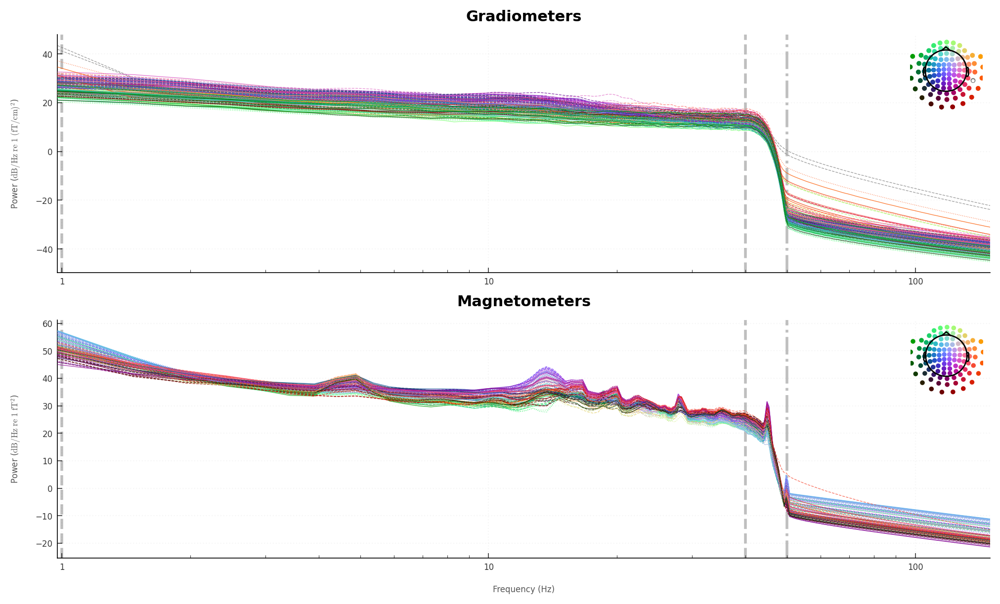

0164


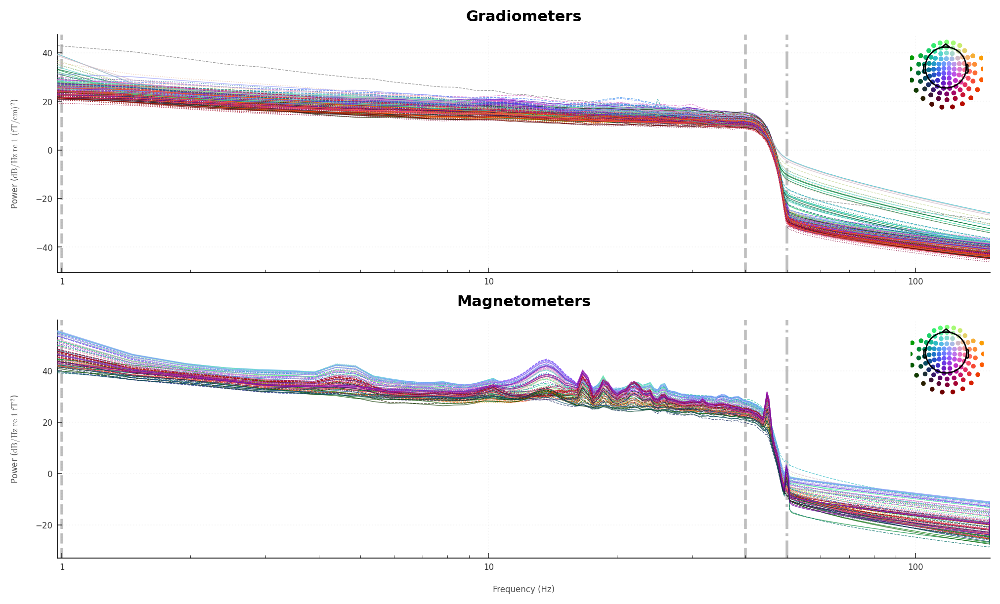

0165


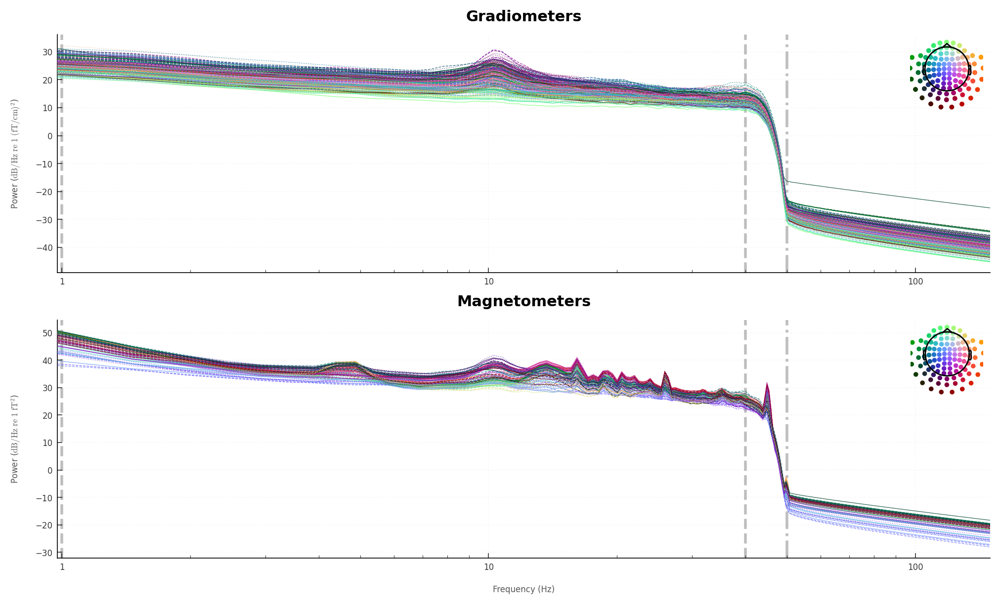

0166


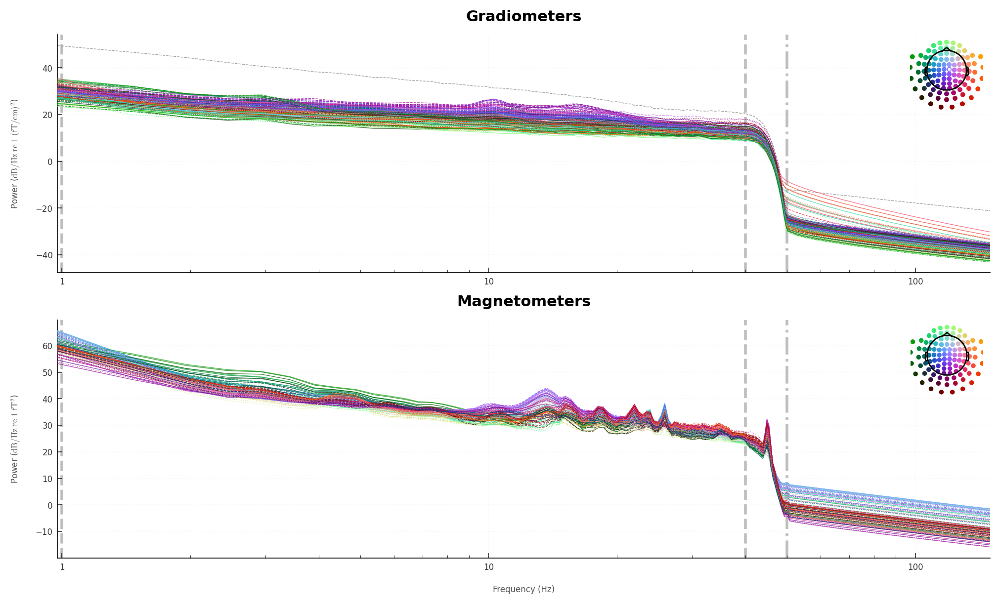

0167


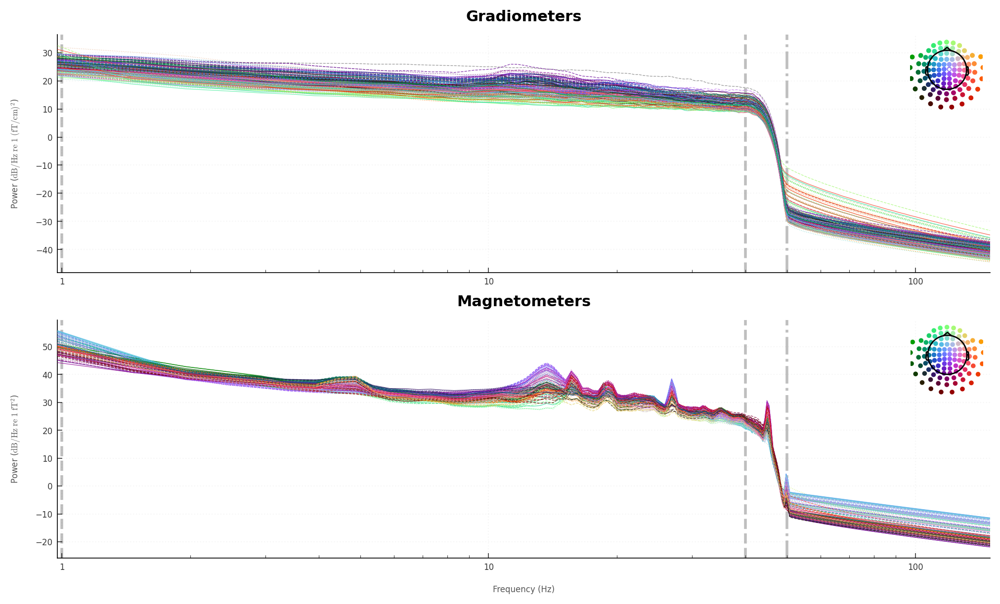

0168


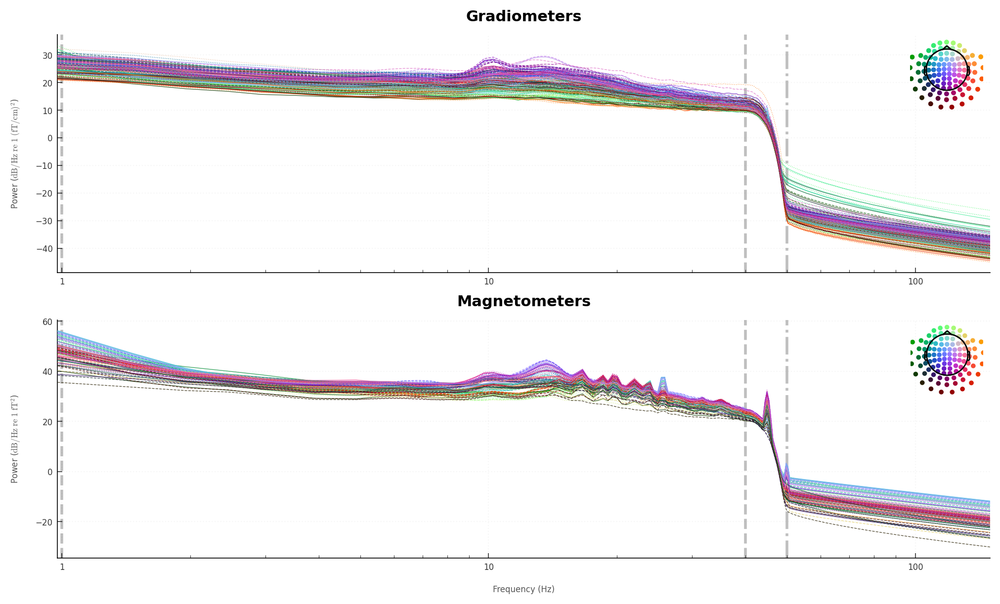

0169


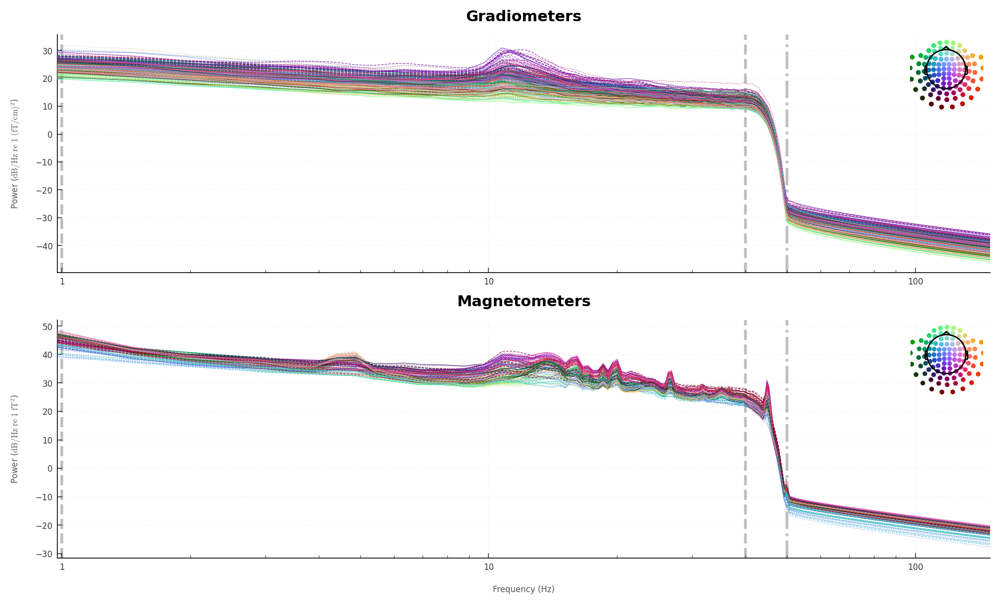

0170


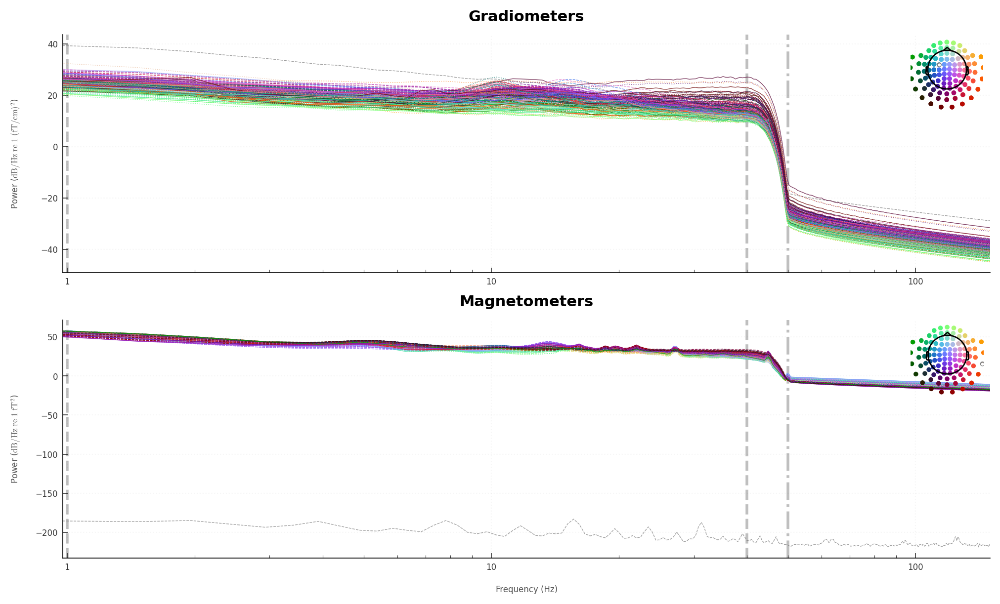

In [9]:
for participant_id in participant_ids:
    print(participant_id)
    display(get_participant_raw(participant_id).compute_psd(
        fmin=0.5,
        fmax=150,
        picks="meg",
    ).plot(xscale="log", show=False))


## Event (re)coding

In [10]:
def recode_events(raw, behav_data, visualize=False):
    raw_events = mne.pick_events(mne.find_events(
        raw,
        stim_channel="STI101",
        shortest_event=1,
    ), include=[1, 3, 4, 6, 8, 10, 12, 14, 16])

    events = np.column_stack((
        raw_events[raw_events[:, 2] < 4, 0],    # timestamp
        [0] * len(behav_data),                  # previous event code
        behav_data["event_code"],               # event code
    ))
    event_coding_map = behav_data.drop_duplicates(subset="event").set_index("event").sort_index()["event_code"].to_dict()

    if visualize:
        fig = mne.viz.plot_events(
            events,
            event_id=event_coding_map,
            sfreq=raw.info["sfreq"],
            on_missing="warn",
        )
        ax = fig.axes[0]
        for line in ax.get_lines():
            line.set_marker("|")
            line.set_markersize(10)
            line.set_color("C0")
        ax.margins(y=0)
        ax.legend([])
        ax.set_yticklabels(event_coding_map.keys())
        display(fig)

    return events, event_coding_map

## Epoching

In [11]:
epochs_export_path = Path() / "exported" / "epoched"
epochs_export_path.mkdir(exist_ok=True, parents=True)

def get_participant_epochs(participant_id, force_overwrite=False):
    raw = get_participant_raw(participant_id)
    behav_data = get_participant_behavioural(participant_id)
    events, event_coding_map = recode_events(raw, behav_data)

    participant_epochs_export_path = epochs_export_path / f"{participant_id}-epo.fif"
    if participant_epochs_export_path.exists() and not force_overwrite:
        epochs = mne.read_epochs(
            participant_epochs_export_path,
            preload=True,
            verbose=False,
        )
    else:
        epochs = mne.Epochs(
            raw=raw,
            events=events,
            event_id=event_coding_map,
            tmin=-0.2,
            tmax=0.5,
            baseline=(None, 0),
            reject=None,
            picks=mne.pick_types(
                raw.info,
                meg=True,
                stim=False,
                exclude="bads",
            ),
            on_missing="warn",
            verbose=False,
        ).drop_bad()

        epochs.save(
            fname=participant_epochs_export_path,
            overwrite=True,
        )

    epochs.event_coding_map = event_coding_map
    epochs.subject = participant_id
    epochs.behav_data = behav_data.loc[epochs.selection]
    return epochs

participant_epochs_map = dict()
for participant_id in participant_ids:
    print(participant_id)
    participant_epochs_map[participant_id] = get_participant_epochs(participant_id)


0163
0164
0165
0166
0167
0168
0169
0170


## Sanity Checks

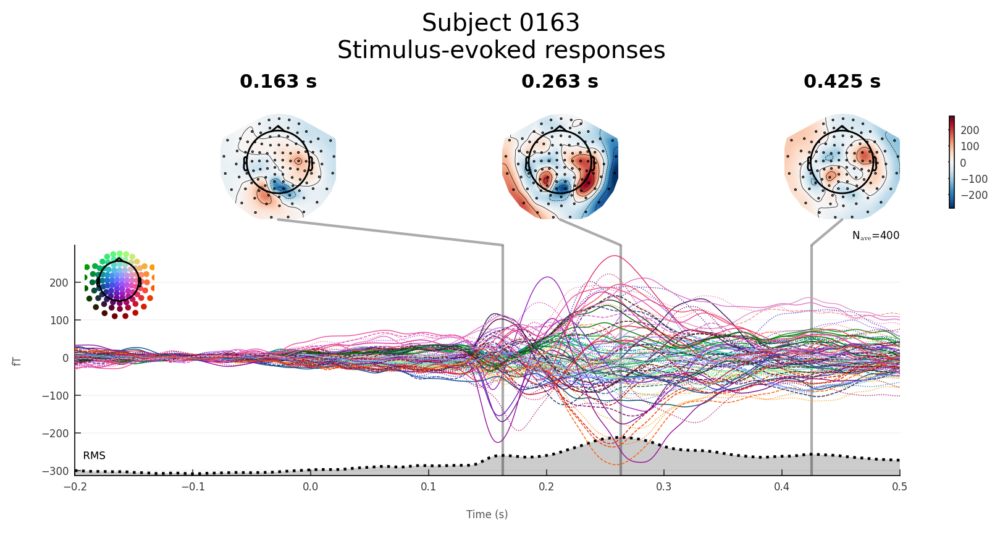

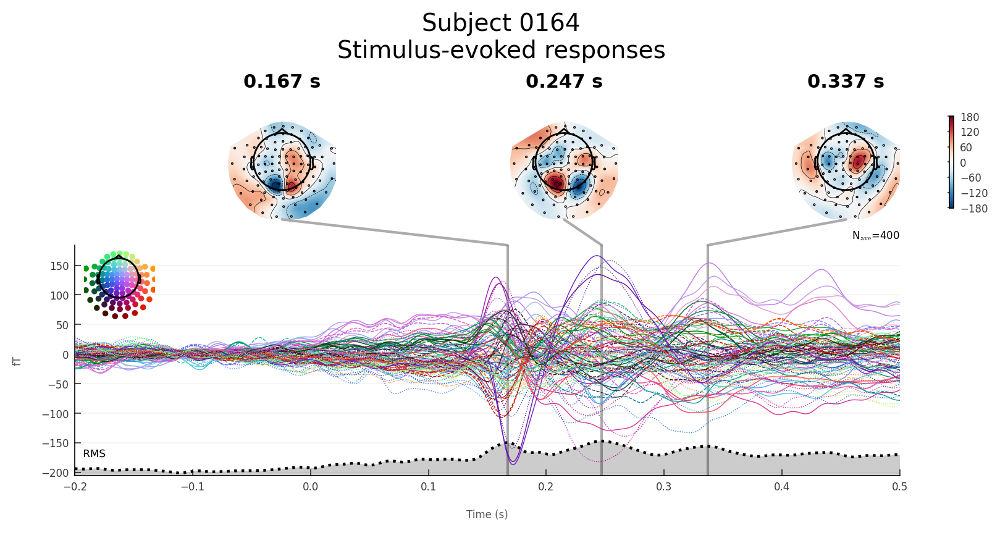

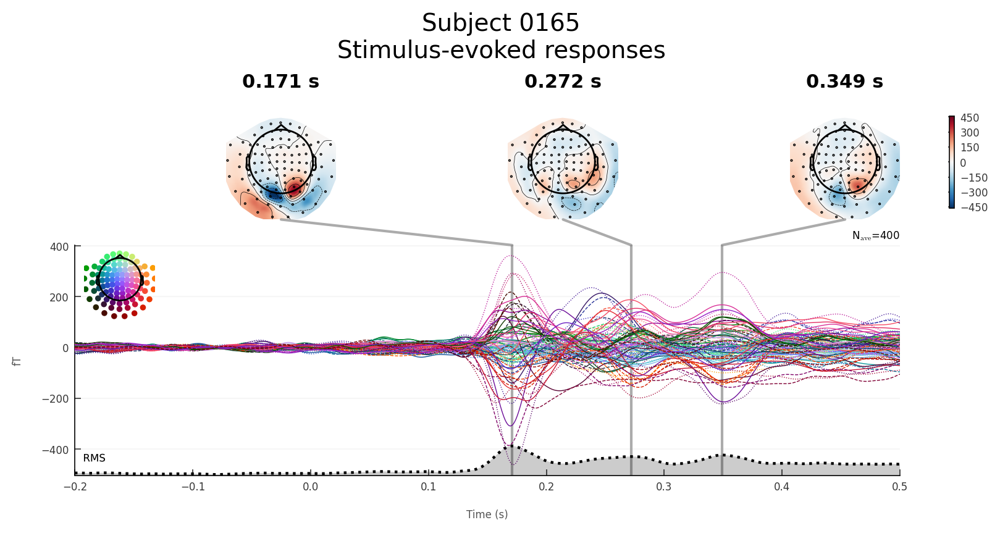

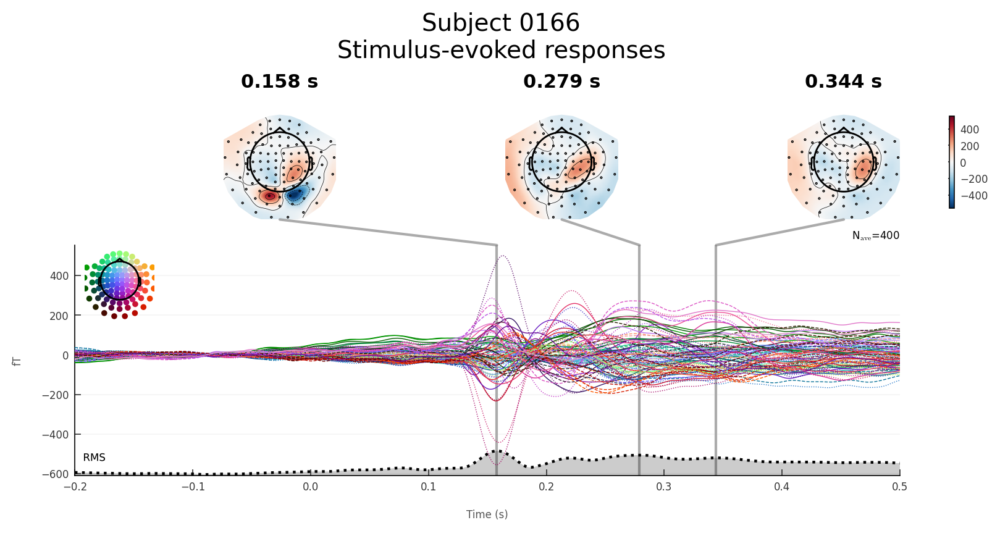

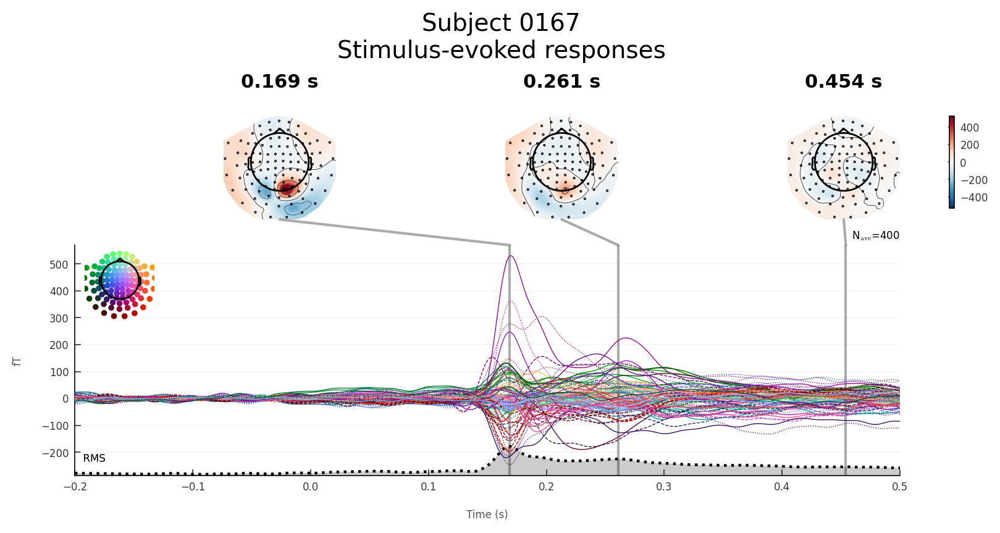

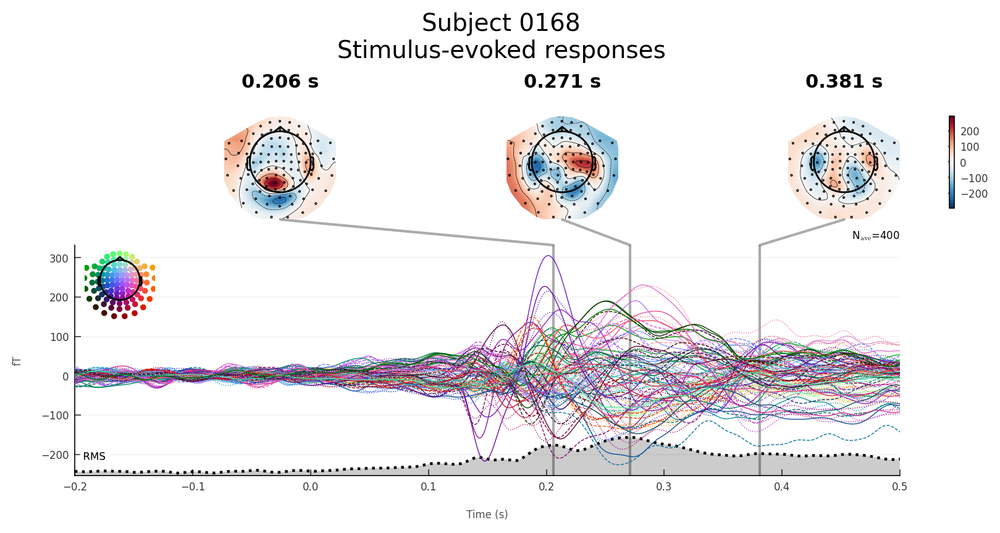

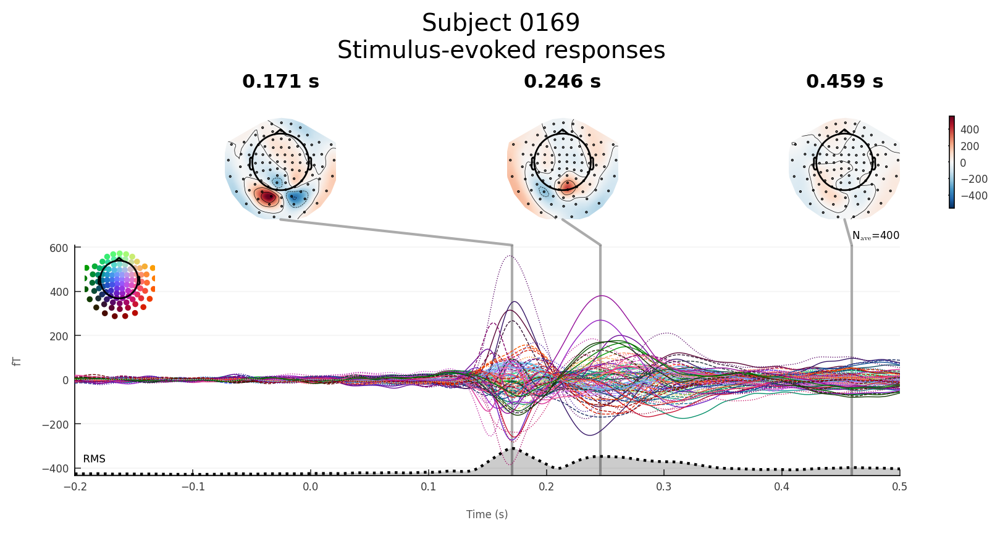

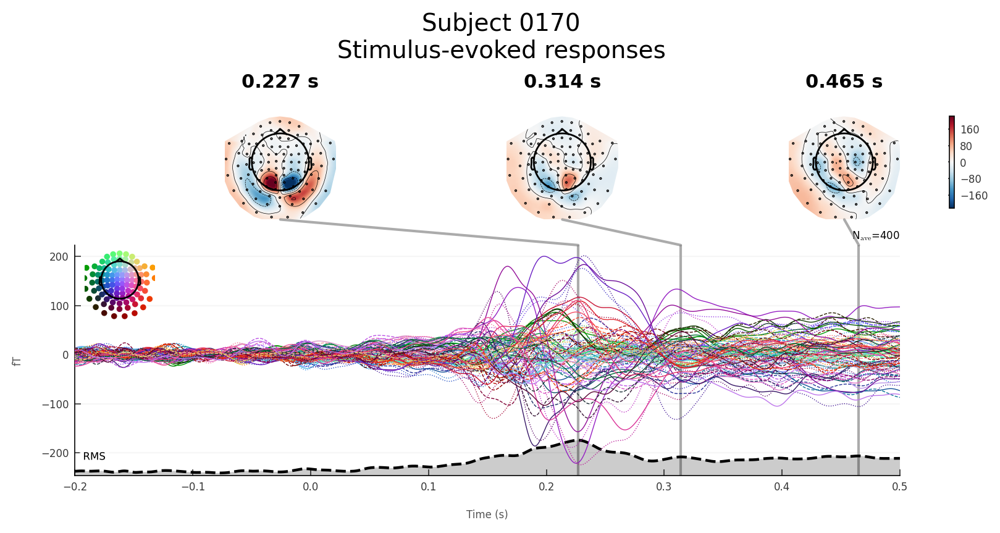

In [12]:
for participant_id, participant_epochs in participant_epochs_map.items():
    fig = participant_epochs.average().plot_joint(
        picks="mag",
        ts_args=dict(
            gfp=True,
        ),
        show=False,
    )
    fig.suptitle(f"Subject {participant_id}\nStimulus-evoked responses")
    display(fig)

In [13]:
selected_sensors = []

region_sensor_mapping = dict(
    occipital=[
        # 191, 231,
        204, 203,
        # 194, 232,
        192, 234,
        211,
        # 193, 233,
    ],
)

sensor_regions = {
    region: {
        "mag": [f"MEG{prefix:>03}1" for prefix in sensor_prefices],
        "grad": [f"MEG{prefix:>03}2" for prefix in sensor_prefices] + [f"MEG{prefix:>03}3" for prefix in sensor_prefices]
    } for region, sensor_prefices in region_sensor_mapping.items()
}


/tmp/ipykernel_85234/3857908114.py:8: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


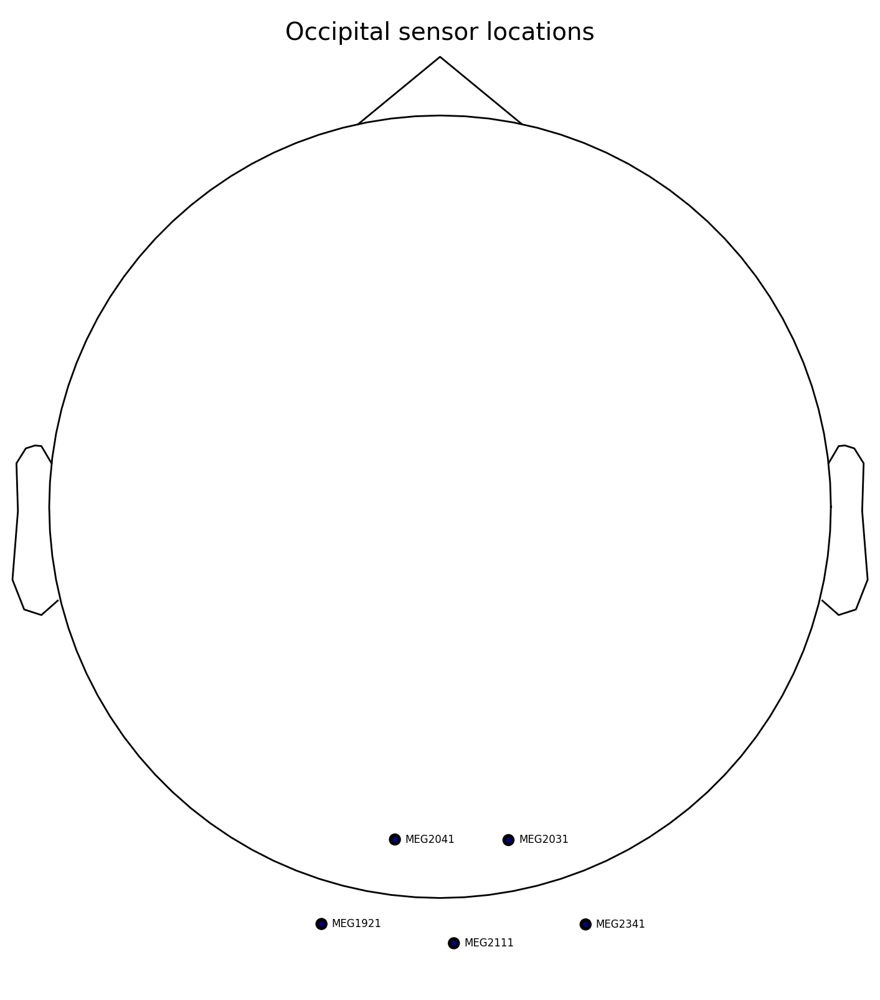

In [14]:
picks = sensor_regions["occipital"]["mag"]
# picks = "mag"
fig = get_participant_raw("0163").pick(picks).plot_sensors(
    ch_type="mag",
    show_names=True,
)
fig.set_size_inches((8, 8))
fig.tight_layout()
fig.suptitle("Occipital sensor locations")
display(fig)

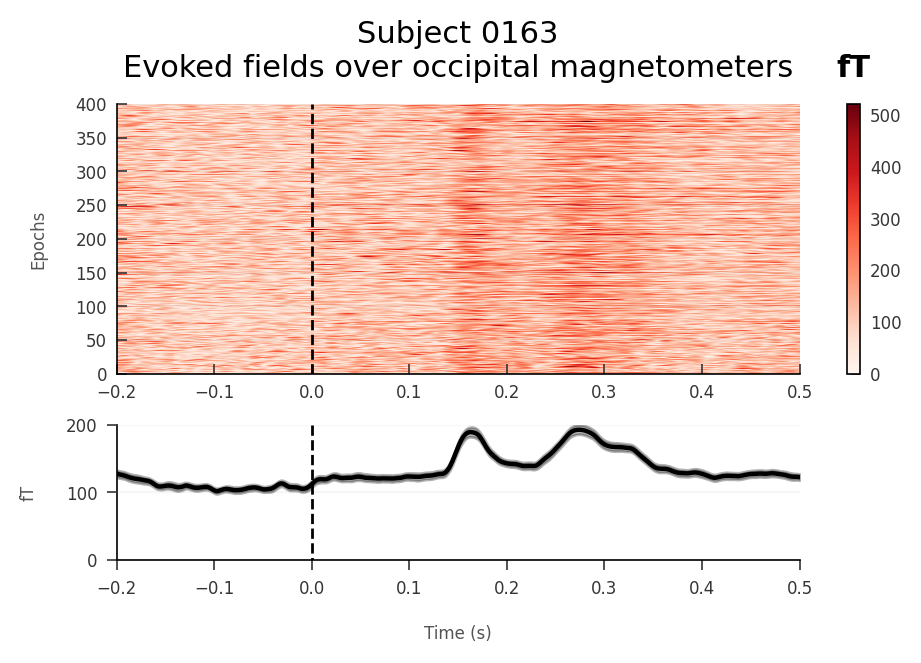

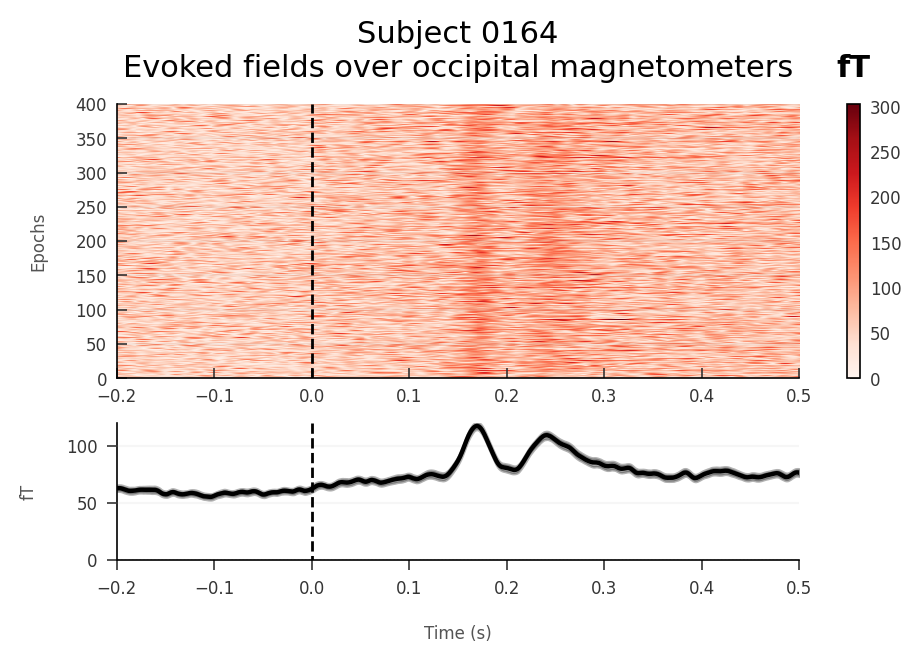

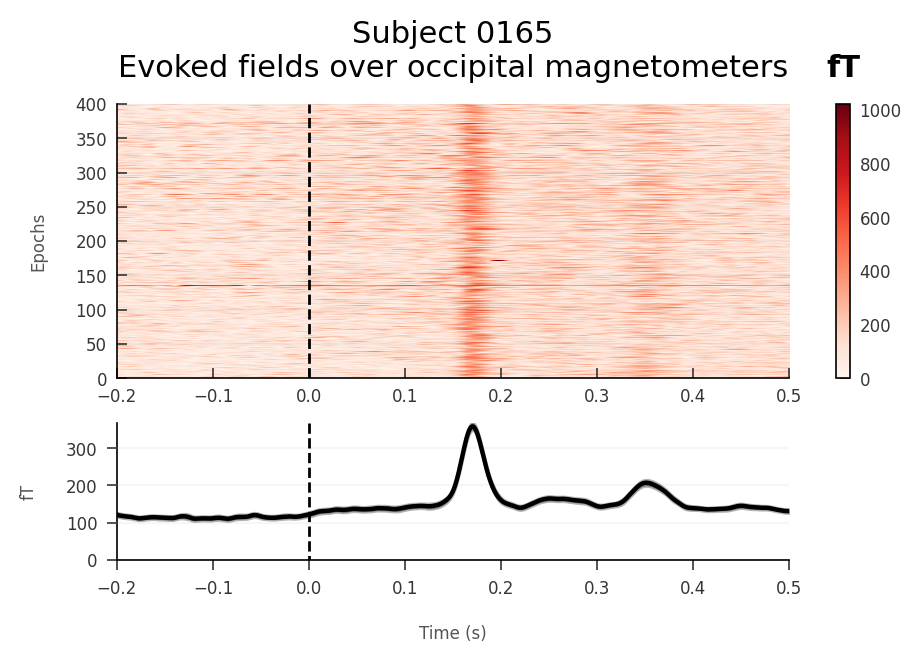

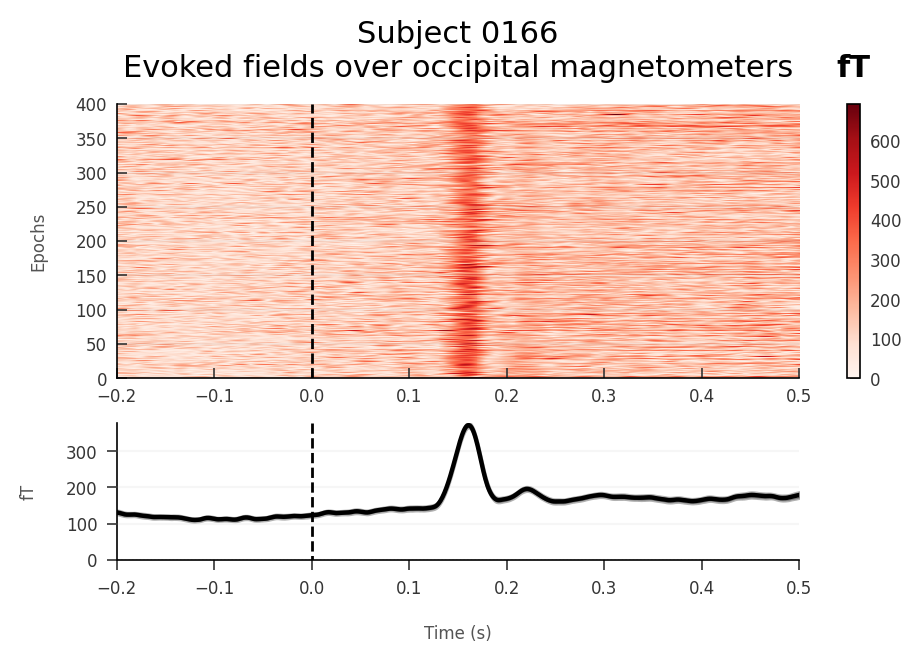

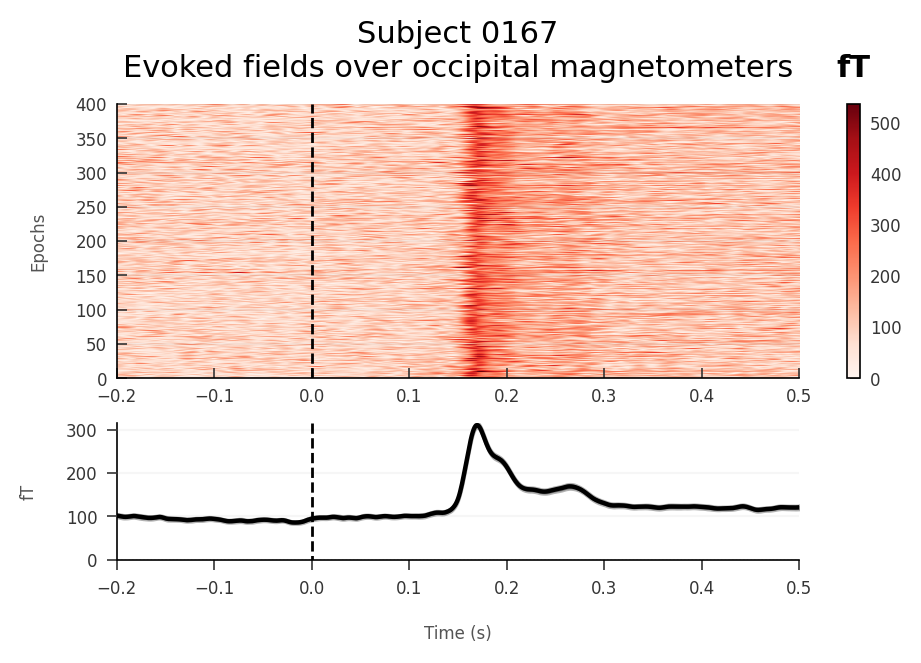

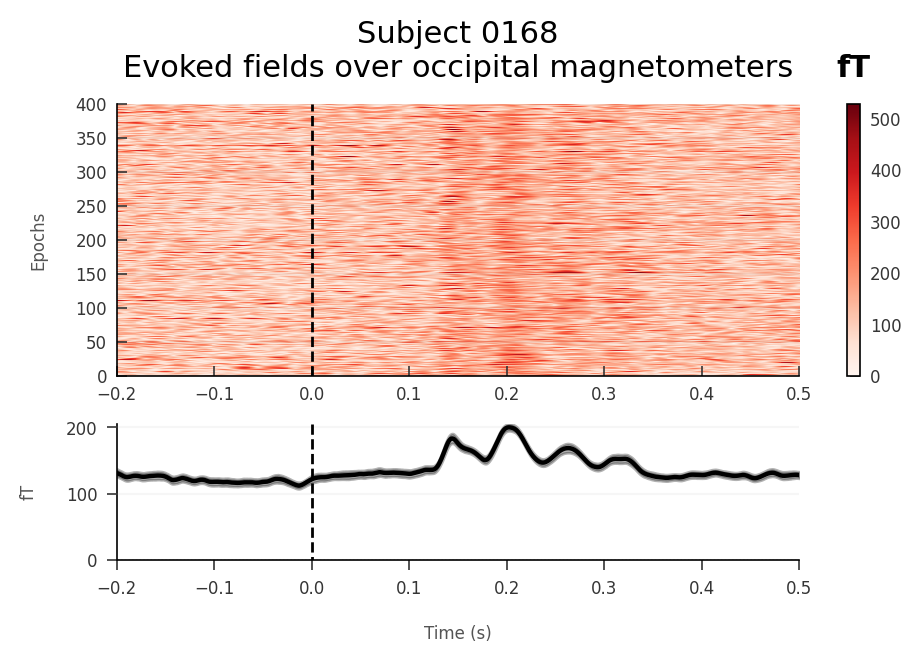

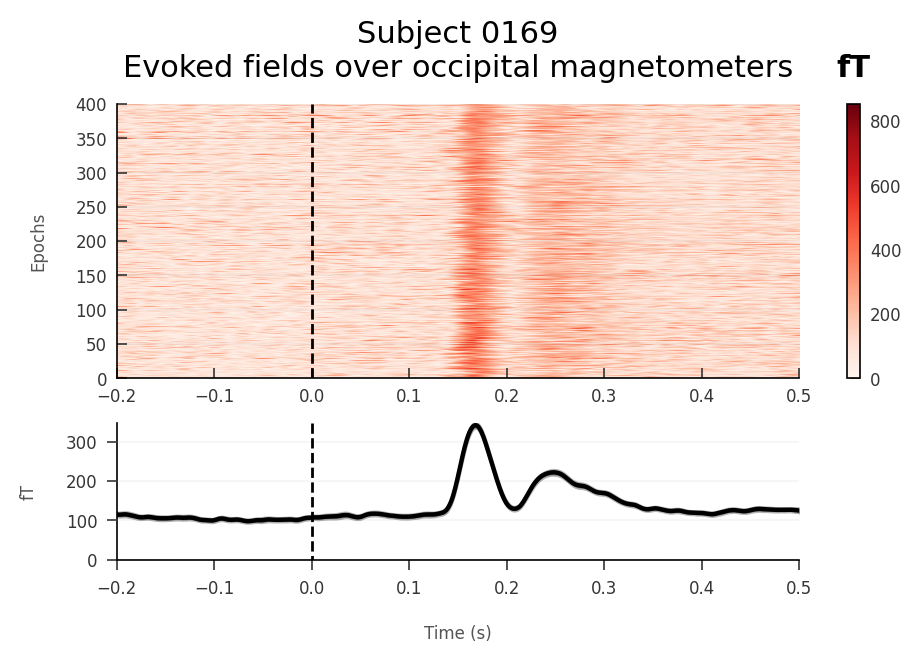

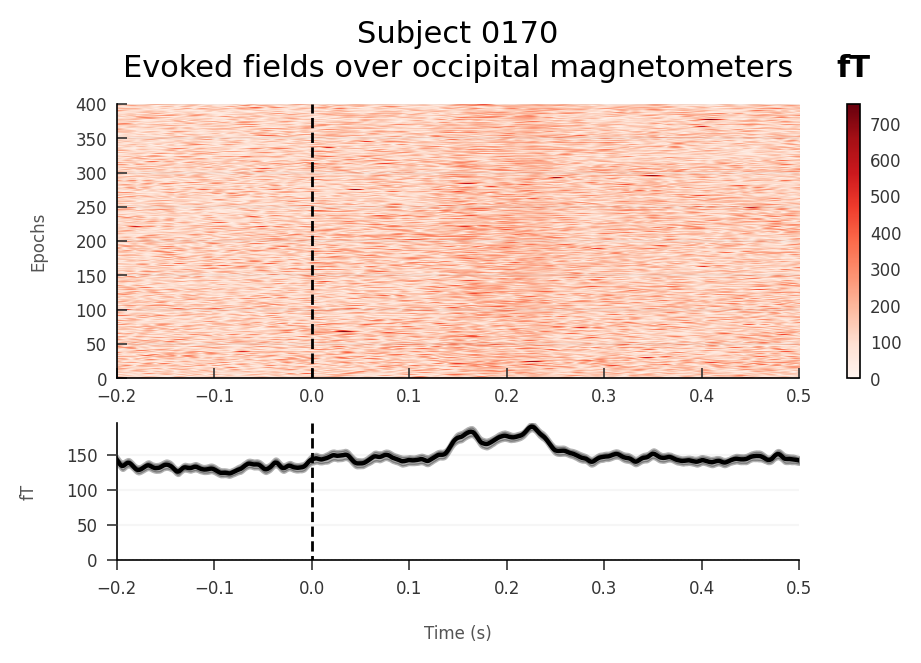

In [15]:
for participant_id, participant_epochs in participant_epochs_map.items():
    fig = participant_epochs.plot_image(
        picks=sensor_regions["occipital"]["mag"],
        combine="gfp",
    )[0]
    fig.axes[1].axhline(
        y=0,
        color="black",
        alpha=0.5,
        linewidth=0.5,
        linestyle="dotted",
    )
    fig.axes[0].set_title(
        f"Subject {participant_id}\nEvoked fields over occipital magnetometers",
        fontweight="normal",
    )
    display(fig)



## Evoked Response Contrast

In [16]:
contrast_conditions = {
    "PAS1": ["PAS1"],
    "PAS2": ["PAS2"],
    "PAS3,4": ["PAS3", "PAS4"],
}

0163


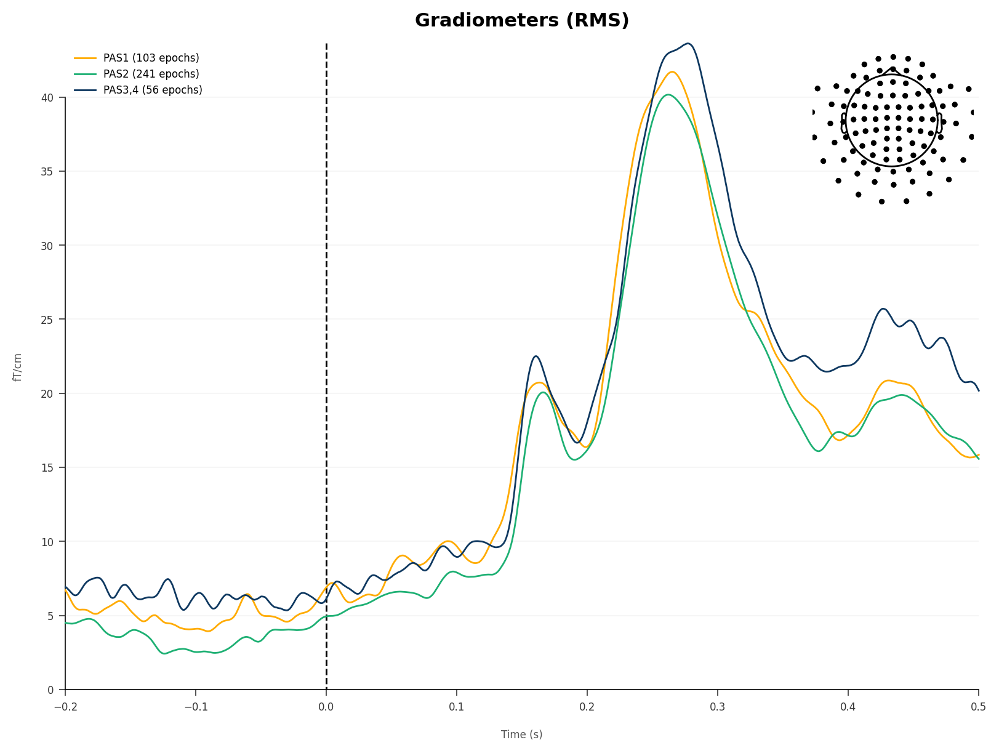

0164


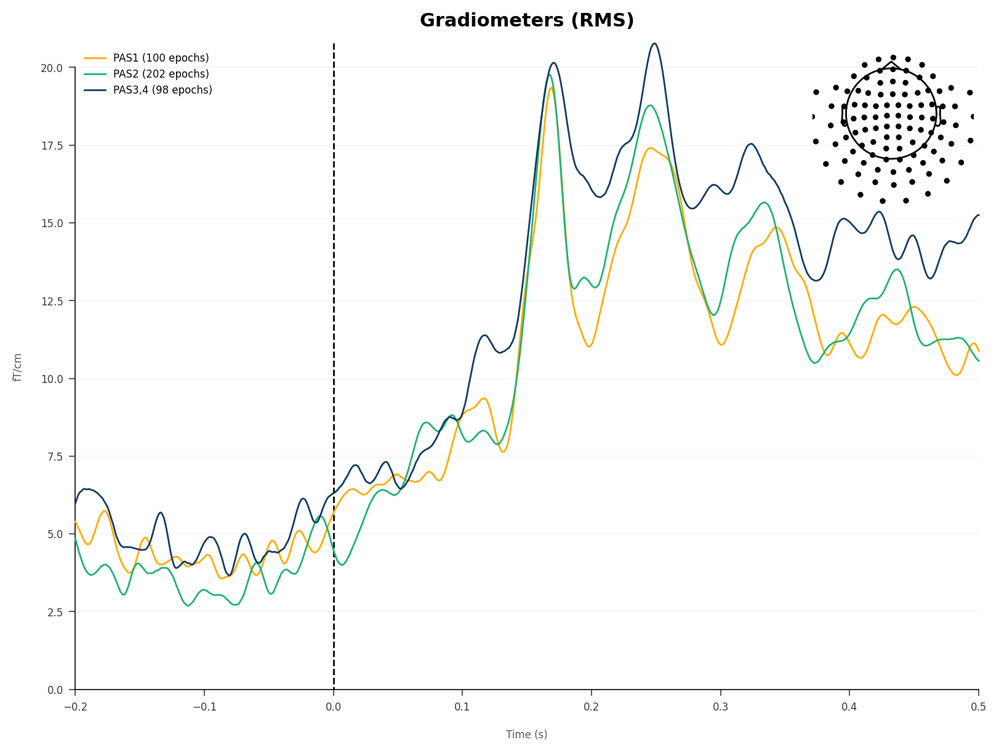

0165


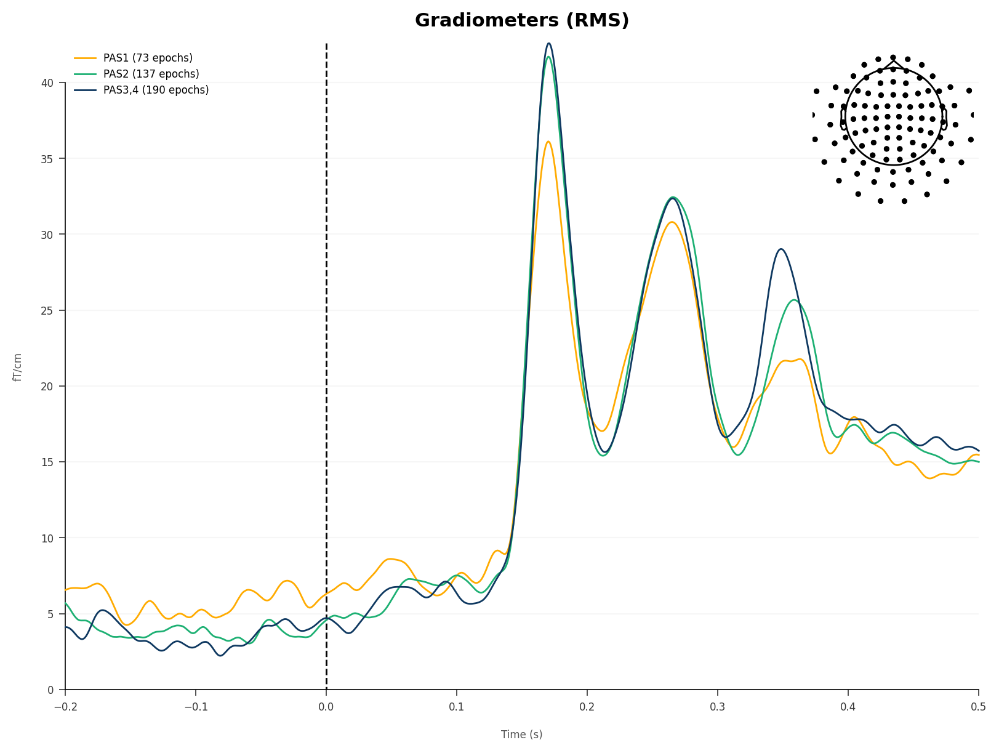

0166


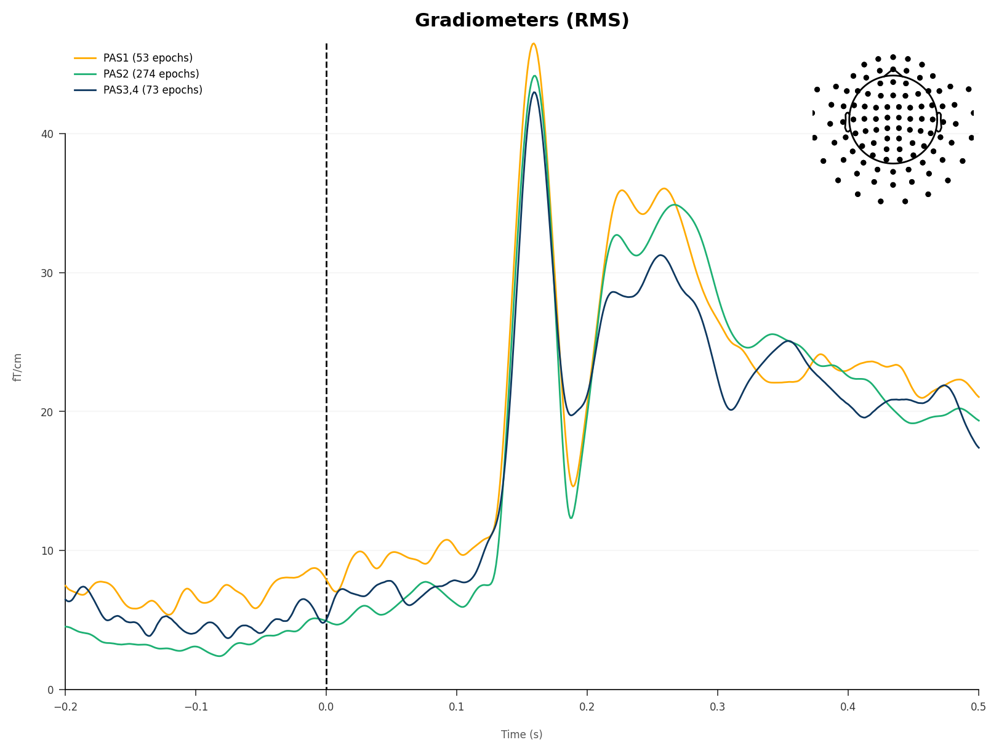

0167


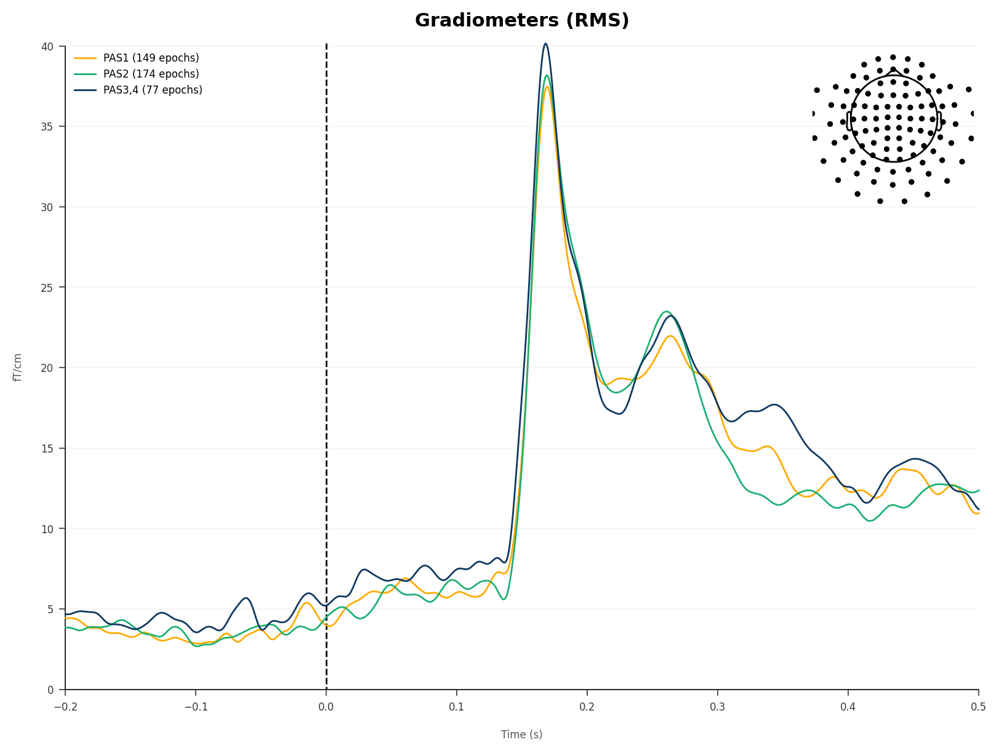

0168


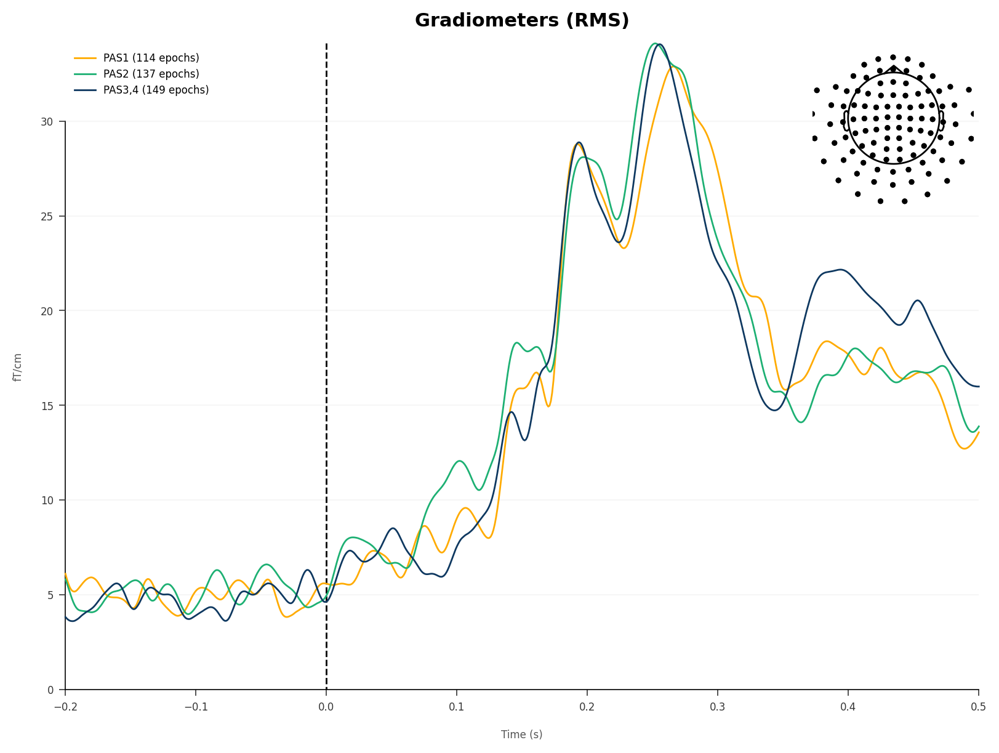

0169


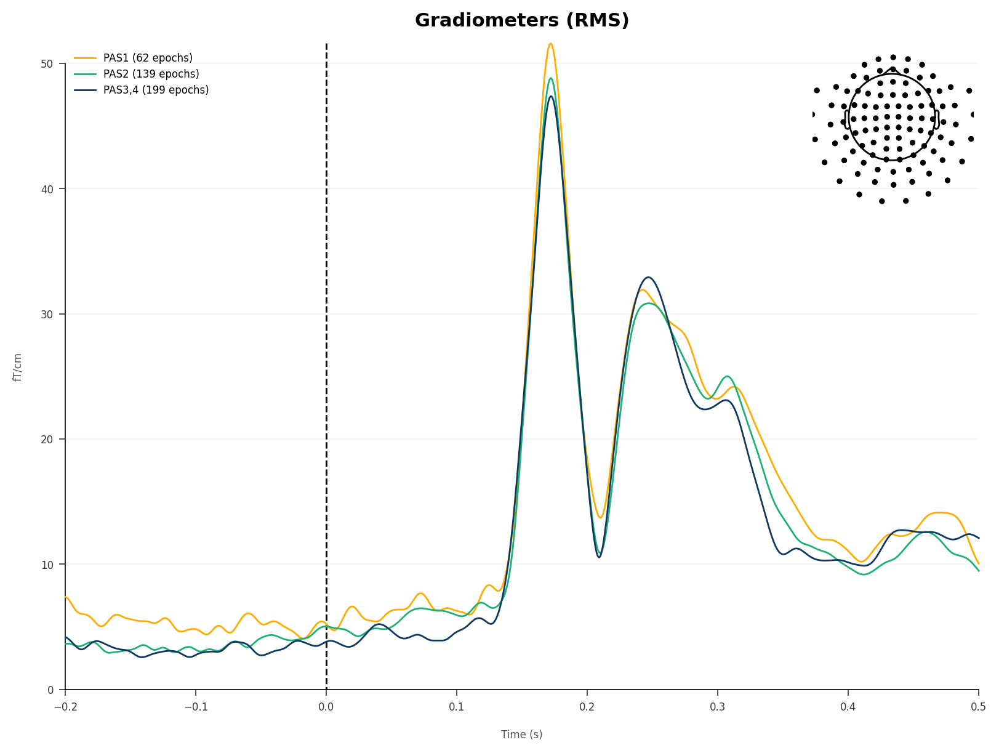

0170


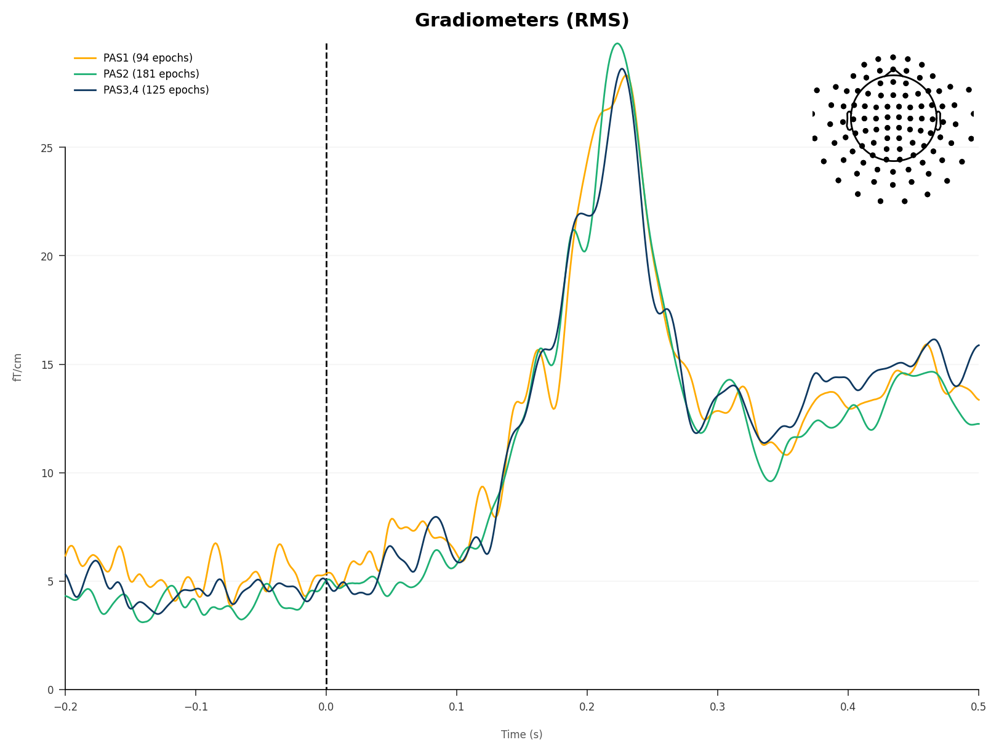

In [17]:
def plot_evokeds(participant_epochs):
    evokeds = dict()
    epoch_counts = dict()
    for condition_name, condition in contrast_conditions.items():
        try:
            evokeds[condition_name] = participant_epochs[condition].average()
            epoch_counts[condition_name] = len(participant_epochs[condition])
        except:
            print(f"No trials in {condition_name}")
    fig = mne.viz.plot_compare_evokeds(
        evokeds=evokeds,
        picks="grad",
        styles={condition_name: dict(
            linewidth=1,
            color=PAS_colormap[condition_name],
            path_effects=([
                patheffects.Stroke(linewidth=0.5, foreground="white"), 
                patheffects.Normal(),
            ]),
        ) for condition_name in evokeds.keys()},
        combine="gfp", # aka. rms
        legend=False,
        ci=0.9,
        show_sensors=True,
    )[0]
    handles, labels = fig.axes[0].get_legend_handles_labels()
    fig.axes[0].legend(
        handles,
        [f"{label} ({epoch_count} epochs)" for label, epoch_count in epoch_counts.items()],
        loc="upper left",
    )
    display(fig)

for participant_id, participant_epochs in participant_epochs_map.items():
    print(participant_id)
    plot_evokeds(participant_epochs)


## Temporal decoding

In [18]:
def temporal_decoding(
    epochs,
    scenario_contrast,
    scoring,
    cv_folds=10,
    n_jobs=-1,
):
    epoch_subset = epochs[sum(scenario_contrast, [])].pick_types(meg=True)

    reverse_event_coding_map = {code: label for label, code in epochs.event_coding_map.items()}

    epoch_labels = []
    for event_code in epochs.events[:, 2]:
        epoch_scenario = reverse_event_coding_map[event_code]
        for scenario_idx, scenario in enumerate(scenario_contrast, start=1):
            if any([event_label in epoch_scenario for event_label in scenario]):
                epoch_labels.append(scenario_idx)

    classification_pipeline = sklearn.pipeline.make_pipeline(
        sklearn.preprocessing.StandardScaler(),
        sklearn.linear_model.LogisticRegression(
            C=1e-9,
            class_weight="balanced",
        ),
    )

    return mne.decoding.cross_val_multiscore(
        estimator=mne.decoding.SlidingEstimator(
            classification_pipeline,
            scoring=scoring,
            n_jobs=n_jobs,
            allow_2d=True,
            verbose=False,
        ),
        X=epoch_subset.get_data(picks="meg", copy=False),
        y=epoch_labels,
        cv=cv_folds,
        n_jobs=n_jobs,
        verbose=False,
    )

def regress_covariate(epochs, covariate, p_threshold=0.01):
    regressed_epochs = epochs.copy()
    behav_data = regressed_epochs.behav_data.loc[regressed_epochs.selection]
    design_matrix = pd.DataFrame({
        "intercept": 1,
        covariate: behav_data[covariate].values,
    })
    linear_model = mne.stats.linear_regression(
        regressed_epochs,
        design_matrix=design_matrix,
        names=design_matrix.columns,
    )
    linear_model[covariate].beta.data = np.where(linear_model[covariate].p_val.data < p_threshold, linear_model[covariate].beta.data, 0)

    regressed_epochs._data -= np.broadcast_to(
        linear_model[covariate].beta.data[np.newaxis, :, :],
        (len(regressed_epochs), len(regressed_epochs.ch_names), len(regressed_epochs.times))
    ) * np.array(design_matrix[covariate])[:, np.newaxis, np.newaxis]

    return regressed_epochs, linear_model

decoding contrast PAS2 vs PAS1
0163
0164
0165
0166
0167
0168
0169
0170
decoding contrast PAS3,4 vs PAS1
0163
0164
0165
0166
0167
0168
0169
0170


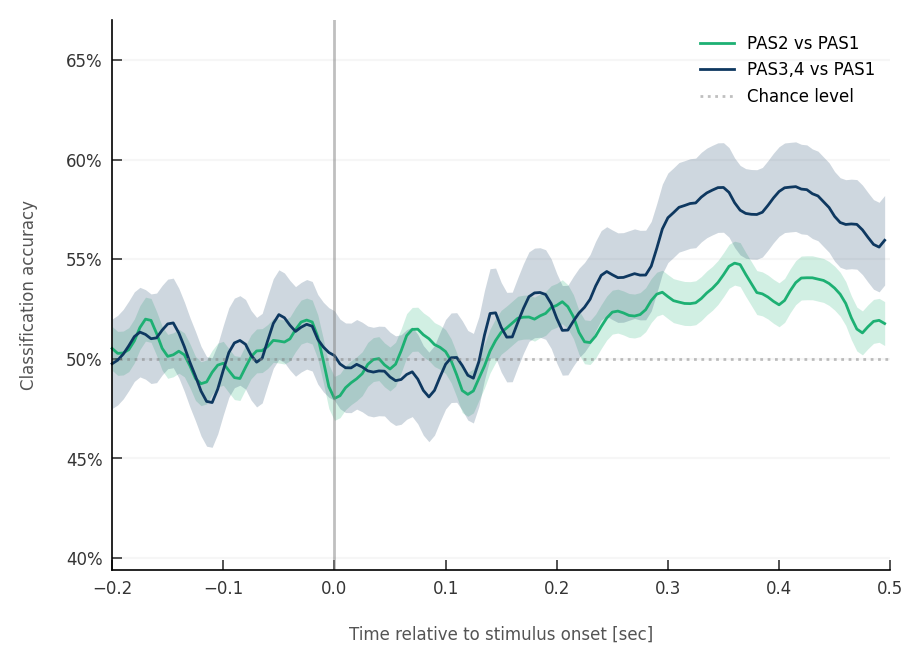

In [19]:
scoring_metric = "accuracy"

fig, ax = plt.subplots()
for contrast_name, contrast in {
    "PAS2 vs PAS1": (["PAS2"], ["PAS1"]),
    "PAS3,4 vs PAS1": (["PAS3", "PAS4"], ["PAS1"]),
}.items():
    print("decoding contrast", contrast_name)

    per_participant_scores = []
    for participant_id, participant_epochs in participant_epochs_map.items():
        print(participant_id)

        decoding_epochs = participant_epochs.copy().resample(sfreq=200)
        decoding_epochs, linear_model = regress_covariate(
            decoding_epochs,
            covariate="target_contrast",
        )

        participant_scores = temporal_decoding(
            decoding_epochs,
            contrast,
            scoring=scoring_metric,
            cv_folds=5,
            n_jobs=-1,
        )
        if participant_scores is None:
            continue
        per_participant_scores.append(participant_scores.mean(axis=0)) # mean score across folds)

    # per_participant_scores = np.array(per_participant_scores)
    per_participant_scores = np.array([pd.Series(scores).rolling(window=5, min_periods=1, win_type="triang").mean() for scores in per_participant_scores])

    colormap_name = contrast_name.split(" vs ")[0]
    ax.plot(
        decoding_epochs.times,
        per_participant_scores.mean(axis=0),
        linewidth=1,
        clip_on=False,
        color=PAS_colormap[colormap_name],
        label=contrast_name,
    )
    lower_bound, upper_bound = stats.t.interval(
        confidence=0.9,
        df=len(per_participant_scores) - 1,
        loc=per_participant_scores.mean(axis=0),
        scale=np.std(per_participant_scores.mean(axis=0)) / np.sqrt(len(per_participant_scores)),
    )
    ax.fill_between(
        x=decoding_epochs.times,
        y1=lower_bound,
        y2=upper_bound,
        color=PAS_colormap[colormap_name],
        linewidth=0,
        alpha=0.2,
    )

ax.axvline(
    x=0,
    color="grey",
    alpha=0.5,
    linewidth=1,
)
ax.axhline(
    y=0.5,
    color="grey",
    alpha=0.5,
    linewidth=1,
    linestyle="dotted",
    label="Chance level",
)
ax.legend(loc="upper right")
ax.set_xlim(left=-0.2, right=0.5)
ax.margins(y=0.4)
ax.yaxis.set_major_formatter(ticker.PercentFormatter(1, decimals=0))
ax.set_ylabel("Classification accuracy")
ax.set_xlabel("Time relative to stimulus onset [sec]")

display(fig)



## Source Estimation

In [20]:
source_estimate_export_path = Path() / "exported" / "sources"
source_estimate_export_path.mkdir(exist_ok=True, parents=True)

# for participant_id, participant_epochs in participant_epochs_map.items():
#     print(participant_id)
#     participant_inverse_operator = mne.minimum_norm.make_inverse_operator(
#         info=participant_epochs.info,
#         forward=mne.make_forward_solution(
#             participant_epochs.info,
#             trans=list((meg_data_path / participant_id).iterdir())[0] / f"workshop_2025-trans.fif",
#             src=corregistration_data_path / participant_id / "bem" / f"{participant_id}-oct-6-src.fif",
#             bem=corregistration_data_path / participant_id / "bem" / f"{participant_id}-5120-bem-sol.fif",
#         ),
#         noise_cov=mne.compute_covariance(
#             participant_epochs,
#             method="empirical",
#             tmin=None,
#             tmax=0,
#             verbose=False,
#             n_jobs=-1,
#         ),
#         verbose=False,
#     )
#     subject_source_estimates = dict()
#     for condition_name, condition in contrast_conditions.items():
#         condition_source_estimate_cache_path = source_estimate_export_path / f"{participant_id}_{condition_name}"
#         if (source_estimate_export_path / f"{participant_id}_{condition_name}-lh.stc").exists():
#             subject_source_estimates[condition_name] = mne.read_source_estimate(condition_source_estimate_cache_path)
#             subject_source_estimates[condition_name].subject = participant_id
#         else:
#             try:
#                 print(f"Computing estimate for '{condition_name}'")
#                 if len(participant_epochs[condition]) < 10:
#                     print(f"Too few trials in condition '{condition_name}' for subject {participant_id}. Skipping.")
#                     continue
#                 subject_source_estimates[condition_name] = mne.minimum_norm.apply_inverse(
#                     evoked=participant_epochs[condition].average(),
#                     inverse_operator=participant_inverse_operator,
#                     method="dSPM",
#                     lambda2=1,
#                 )
#                 subject_source_estimates[condition_name].save(
#                     fname=condition_source_estimate_cache_path,
#                     overwrite=True,
#                 )
#             except KeyError:
#                 print(f"No trials in condition '{condition_name}' for subject {participant_id}. Skipping.")



## Group-level (morphed) source estimates

In [21]:
grand_average_morphed_source_estimates = dict()
for condition_name in contrast_conditions.keys():
    condition_cache_path = source_estimate_export_path / f"fsaverage_{condition_name}-rh.stc"

    if condition_cache_path.exists():
        grand_average_morphed_source_estimates[condition_name] = mne.read_source_estimate(
            fname=condition_cache_path,
            subject="fsaverage",
        )
        continue

    condition_source_estimates = []
    print(f"Producing grand average morphed source time course for condition {condition_name}")
    for participant_id in participant_ids:
        print(f"Morphing participant {participant_id}")

        if not source_estimate_export_path / f"{participant_id}_{condition_name}-rh.stc" in list(source_estimate_export_path.glob(f"{participant_id}_*")):
            print(f"Condition '{condition_name}' not found for subject {participant_id}")
            continue

        participant_condition_source_estimate = mne.read_source_estimate(
            fname=source_estimate_export_path / f"{participant_id}_{condition_name}",
        )
        # morph = mne.compute_source_morph(
        #     participant_condition_source_estimate,
        #     subject_from=participant_id,
        #     subject_to="fsaverage",
        #     subjects_dir=corregistration_data_path,
        # )
        morph = mne.read_source_morph(
            fname=corregistration_data_path / participant_id / "bem" / f"{participant_id}-oct-6-src-morph.h5",
        )
        condition_source_estimates.append(morph.apply(participant_condition_source_estimate))

    if len(condition_source_estimates):
        grand_average_morphed_source_estimates[condition_name] = mne.SourceEstimate(
            data=np.array([stc.data for stc in condition_source_estimates]).mean(axis=0),
            vertices=condition_source_estimates[0].vertices,
            tmin=condition_source_estimates[0].tmin,
            tstep=condition_source_estimates[0].tstep,
            subject="fsaverage",
        )
        grand_average_morphed_source_estimates[condition_name].save(
            fname=str(condition_cache_path)[:-7],
            overwrite=True,
        )

grand_average_morphed_source_estimates

{'PAS1': <SourceEstimate | 20484 vertices, subject : fsaverage, tmin : -200.0 (ms), tmax : 500.0 (ms), tstep : 4.0 (ms), data shape : (20484, 176), ~13.9 MiB>,
 'PAS2': <SourceEstimate | 20484 vertices, subject : fsaverage, tmin : -200.0 (ms), tmax : 500.0 (ms), tstep : 4.0 (ms), data shape : (20484, 176), ~13.9 MiB>,
 'PAS3,4': <SourceEstimate | 20484 vertices, subject : fsaverage, tmin : -200.0 (ms), tmax : 500.0 (ms), tstep : 4.0 (ms), data shape : (20484, 176), ~13.9 MiB>}

## Source Estimate Time Courses in Anatomical Labels

In [22]:
# lobe parcellation according to https://surfer.nmr.mgh.harvard.edu/fswiki/CorticalParcellation
lobe_label_map = dict(
    frontal=[
        "superiorfrontal",
        "rostralmiddlefrontal",
        "caudalmiddlefrontal",
        "parsopercularis",
        "parstriangularis",
        "parsorbitalis",
        "precentral",
        "paracentral",
        "frontalpole",
    ],
    parietal=[
        "superiortemporal",
        "inferiorparietal",
        "supramarginal",
        "postcentral",
        "precuneus",
    ],
    temporal=[
        "superiortemporal",
        "middletemporal",
        "inferiortemporal",
        "bankssts",
        "fusiform",
        "entorhinal",
        "temporalpole",
        "parahippocampal",
    ],
    occipital=[
        "lateraloccipital",
        "lingual",
        "cuneus",
        "pericalcarine",
    ],
)

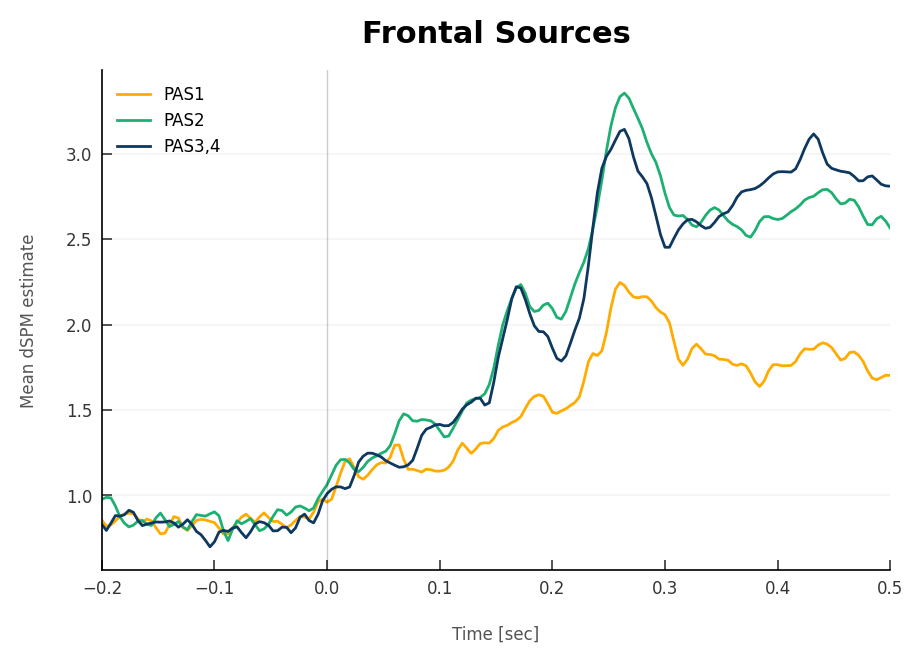

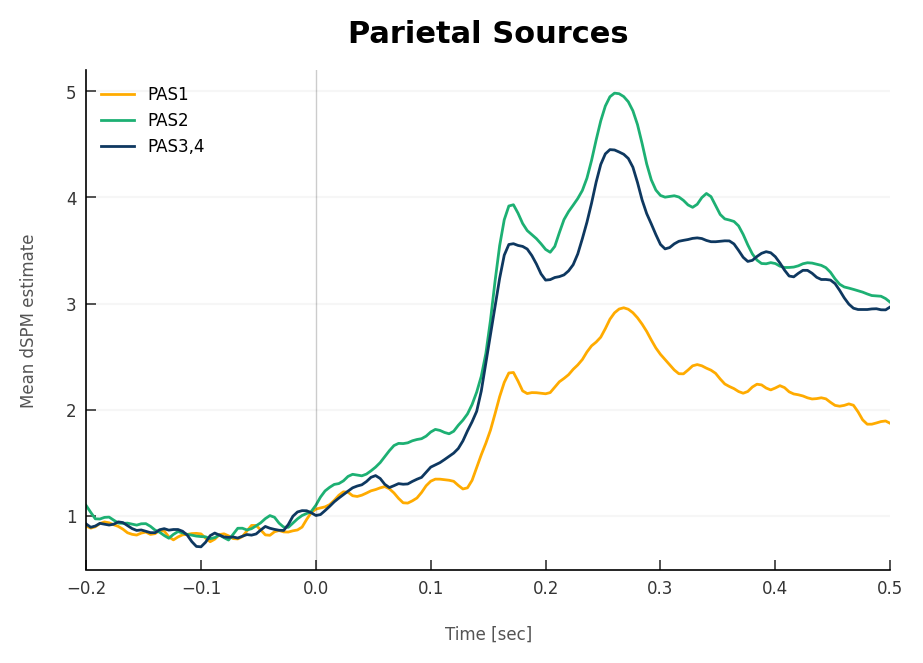

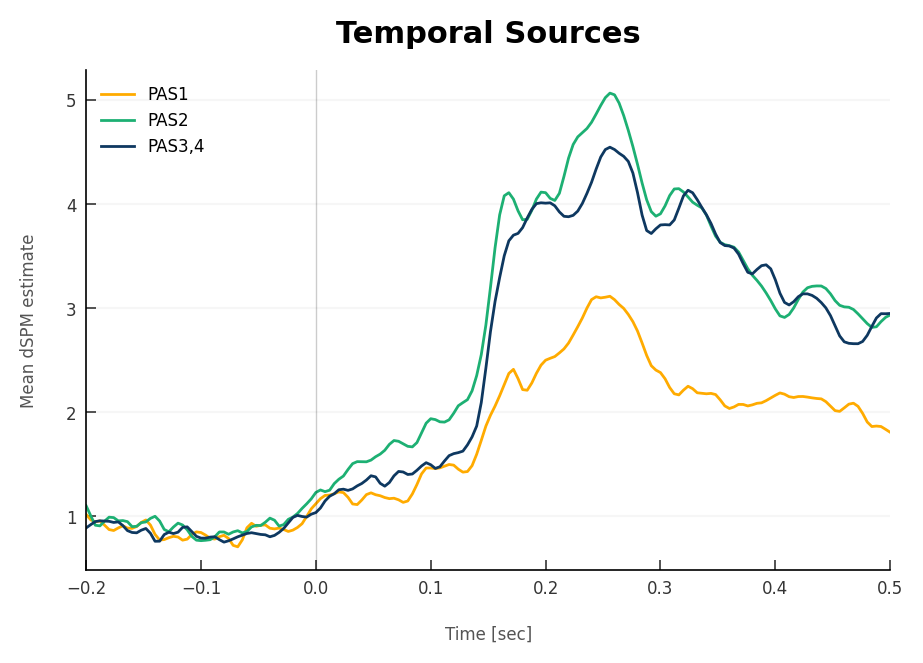

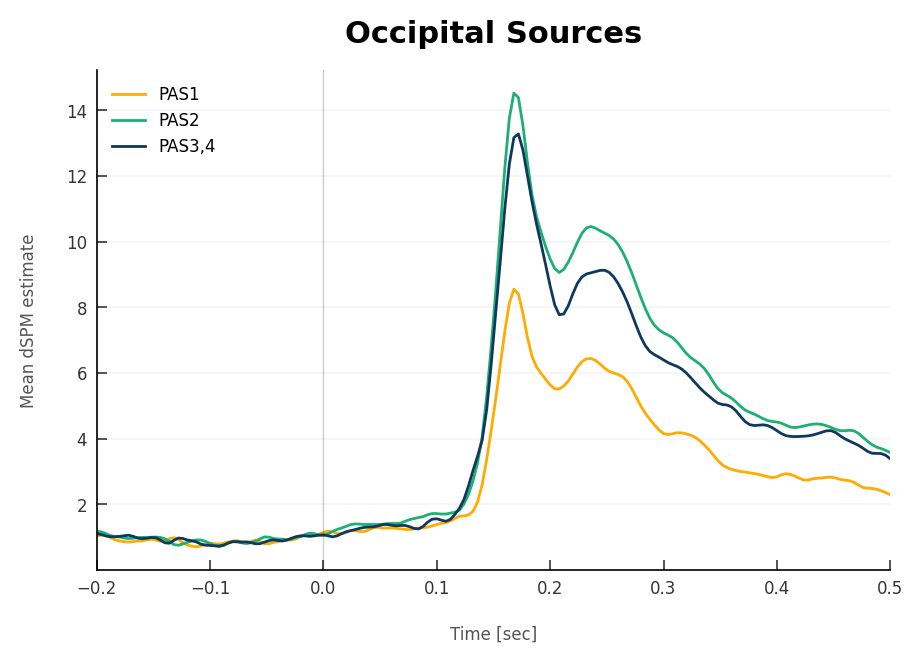

In [23]:
available_labels = [mne.read_label(
    filename=label_path,
    subject="fsaverage", 
) for label_path in (corregistration_data_path / "fsaverage" / "label").glob("*.label")] + mne.read_labels_from_annot(
    subject="fsaverage", 
    subjects_dir=corregistration_data_path,
    hemi="both",
)

def plot_label_time_courses(
    source_time_courses,
    label_selection,
    title,
):
    fig, ax = plt.subplots()
    for condition_name, source_estimate in source_time_courses.items():

        label_set = [label for label in available_labels if label.name[:-3] in label_selection]
        combined_label = sum(label_set[1:], start=label_set[0])
        in_label = source_estimate.in_label(combined_label)

        ax.plot(
            in_label.times,
            in_label.data.mean(axis=0),
            label=condition_name,
            # label=f"{condition_name} - PAS1",
            color=PAS_colormap[condition_name],
            linewidth=1,
        )
    ax.axvline(x=0, color="black", alpha=0.2, linewidth=0.5)
    ax.set_xlim(left=-0.2, right=0.5)
    # ax.set_ylim(
    #     bottom=0,
    # )
    ax.set_xlabel("Time [sec]")
    # ax.set_ylabel("Current\ndensity (Am)", rotation=0, y=1.05, x=1, ha="left")
    ax.set_ylabel("Mean dSPM estimate")
    ax.set_title(title)
    ax.legend(
        loc="upper left",
    )

    display(fig)

for title, label_selection in [
    ("Frontal Sources", lobe_label_map["frontal"]),
    ("Parietal Sources", lobe_label_map["parietal"]),
    ("Temporal Sources", lobe_label_map["temporal"]),
    ("Occipital Sources", lobe_label_map["occipital"]),
]:
    plot_label_time_courses(
        source_time_courses=grand_average_morphed_source_estimates,
        label_selection=label_selection,
        title=title,
    )

## Cortical maps of Source Activation Differences

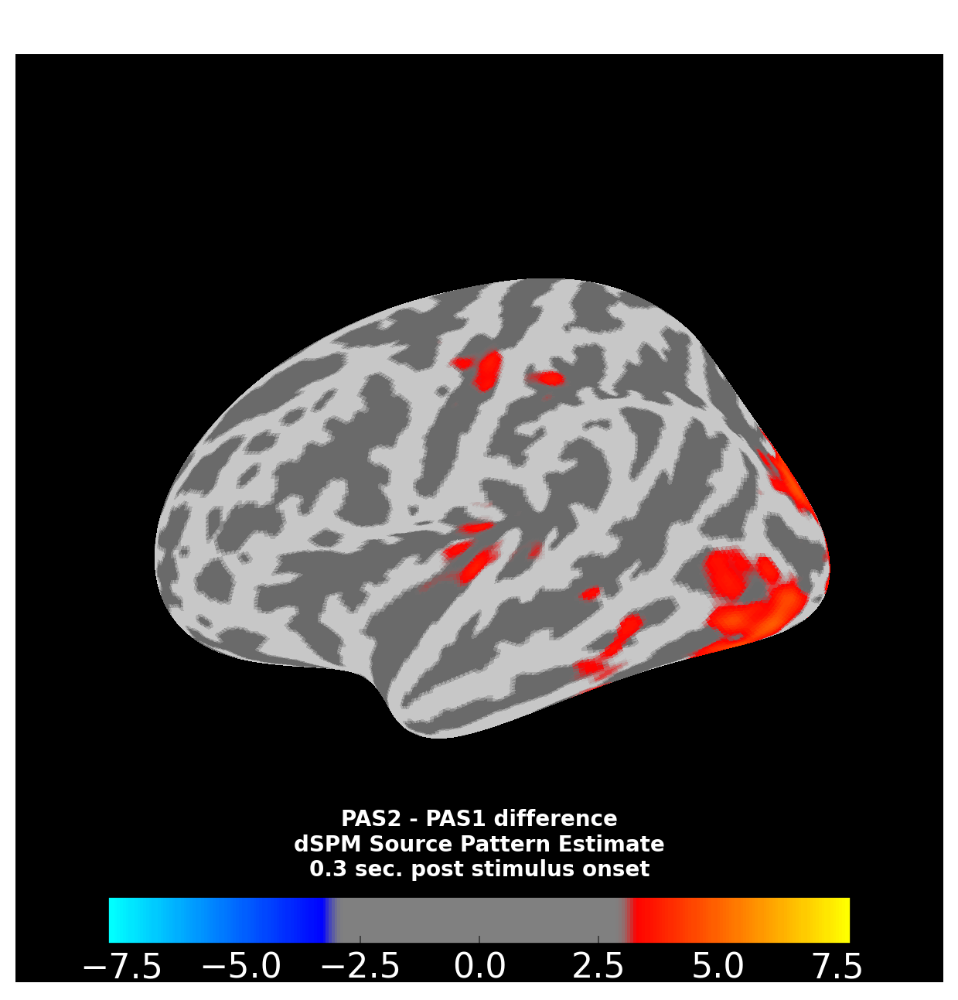

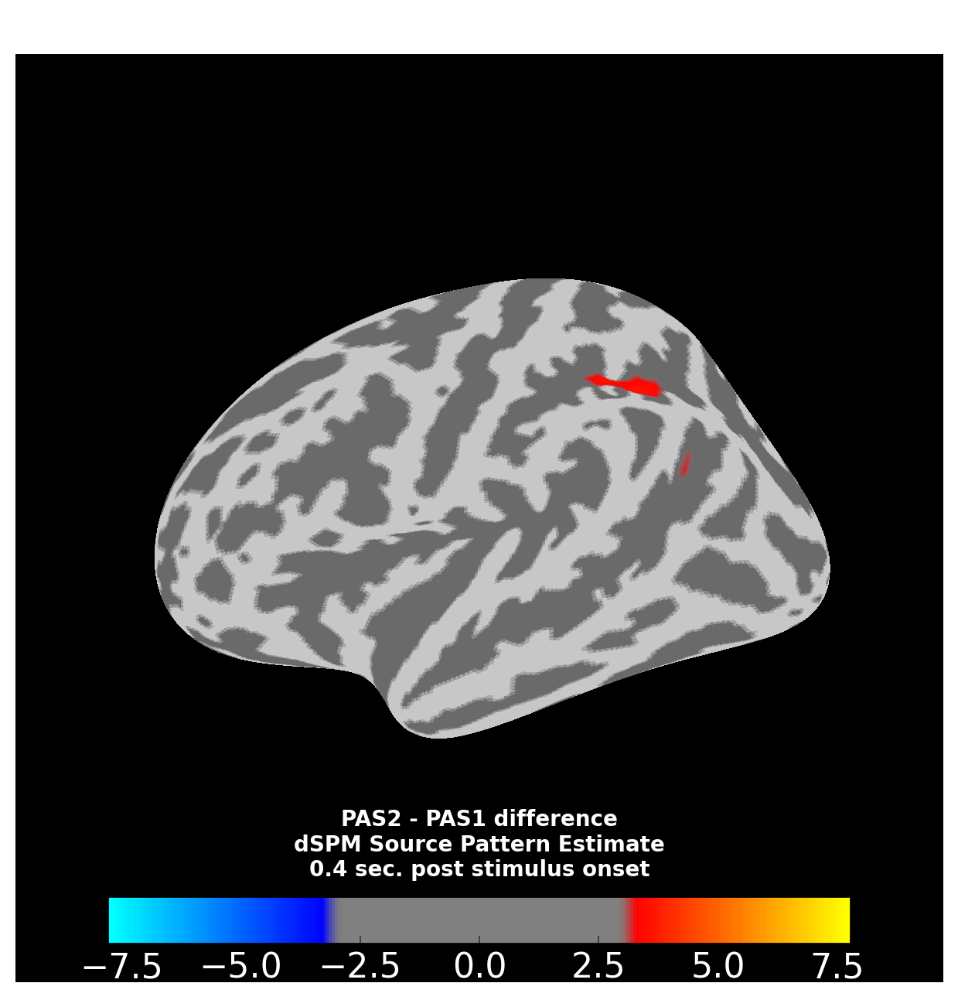

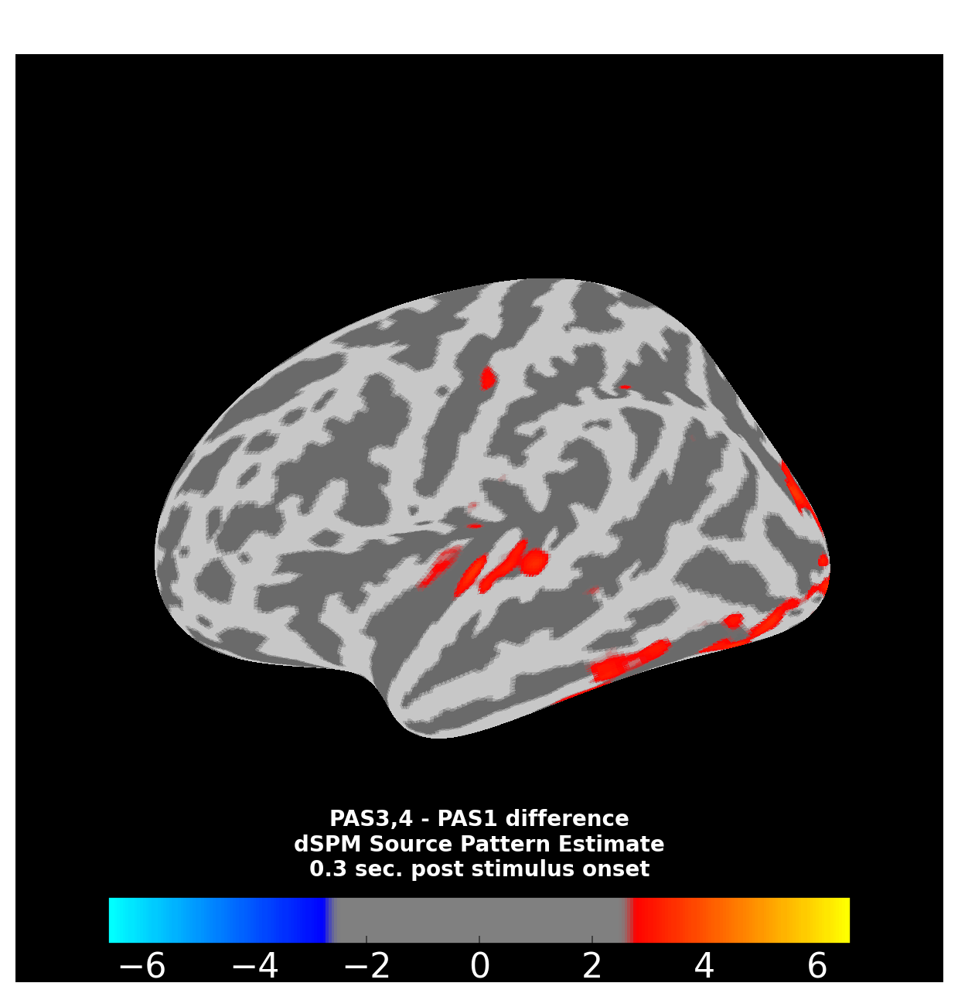

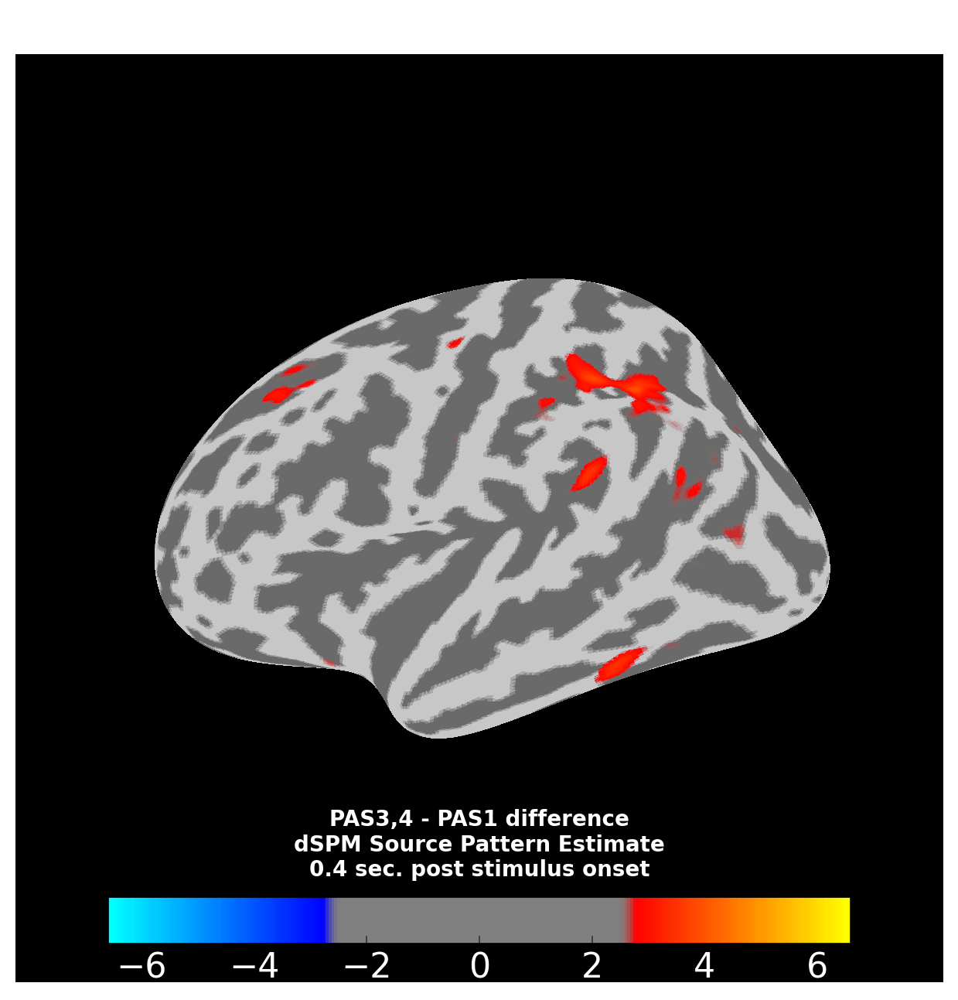

In [ ]:
for condition_name, source_estimate in grand_average_morphed_source_estimates.items():
    if condition_name == "PAS1":
        continue
    source_estimate = source_estimate - grand_average_morphed_source_estimates["PAS1"]
    for timepoint in [
        0.3,
        0.4,
    ]:
        fig = source_estimate.plot(
            subject="fsaverage",
            subjects_dir=corregistration_data_path, 
            backend="matplotlib",
            hemi="lh",
            views="lat",
            initial_time=timepoint,
            smoothing_steps=10,
            spacing="ico6",
            size=600,
            verbose=False,
        )
        fig.get_axes()[0].autoscale(tight=True)
        fig.get_axes()[1].set_title(
            f"{condition_name} - PAS1 difference\ndSPM Source Pattern Estimate\n{timepoint} sec. post stimulus onset",
            color="white",
            size=10,
        )
        display(fig)

In [25]:
%load_ext watermark
%watermark -iv -v -m

Python implementation: CPython
Python version       : 3.12.3
IPython version      : 9.5.0

Compiler    : GCC 13.3.0
OS          : Linux
Release     : 5.15.186.el8
Machine     : x86_64
Processor   : x86_64
CPU cores   : 64
Architecture: 64bit

mne       : 1.10.0
matplotlib: 3.10.6
pandas    : 2.3.1
scipy     : 1.16.1
IPython   : 9.5.0
numpy     : 2.3.4
sklearn   : 1.7.1

